In [1]:
# import sqlite3
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

import os
import numpy as np

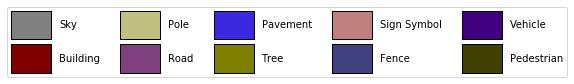

In [122]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

legend_elements = [Patch(facecolor='#808080', edgecolor='black',label='Sky'),
                  Patch(facecolor='#800000', edgecolor='black',label='Building'),
                  Patch(facecolor='#C0C080', edgecolor='black',label='Pole'),
                  Patch(facecolor='#804080', edgecolor='black',label='Road'),
                  Patch(facecolor='#3C28DE', edgecolor='black',label='Pavement'),
                  Patch(facecolor='#808000', edgecolor='black',label='Tree'),
                  Patch(facecolor='#C08080', edgecolor='black',label='Sign Symbol'),
                  Patch(facecolor='#404080', edgecolor='black',label='Fence'),
                  Patch(facecolor='#400080', edgecolor='black',label='Vehicle'),
                  Patch(facecolor='#404000', edgecolor='black',label='Pedestrian')]

# Create the figure

fig, ax = plt.subplots(figsize=(10,1))
ax.legend(handles=legend_elements, loc='center',ncol=5,handlelength=4,handleheight=4)
ax.axis('off')
plt.show()

C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\ipykernel_launcher.py:28: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


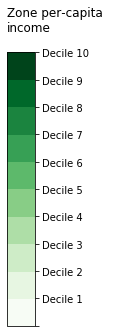

In [17]:

fig, ax = plt.subplots(figsize=(0.5, 10))
fig.subplots_adjust(bottom=0.5)

cmap = plt.get_cmap('Greens', 10)

bounds = [i for i in range(0,11)]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cb3 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                ticks=bounds,
                                spacing='uniform',
                                orientation='vertical')
xlabels = ['',
           'Decile 1',
           'Decile 2',
           'Decile 3',
           'Decile 4',
           'Decile 5',
           'Decile 6',
           'Decile 7',
           'Decile 8',
           'Decile 9',
           'Decile 10']
cb3.set_ticklabels(xlabels)

ax.set_title('Zone per-capita \nincome\n', loc='left')
# ax.set_title('Safety score\n', loc='left')
fig.show()

C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\ipykernel_launcher.py:24: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


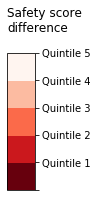

In [25]:

fig, ax = plt.subplots(figsize=(0.5, 5))
fig.subplots_adjust(bottom=0.5)

# cmap = plt.get_cmap('Greens', 5)
cmap = plt.get_cmap('Reds_r', 5)

bounds = [i for i in range(0,6)]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cb3 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                ticks=bounds,
                                spacing='uniform',
                                orientation='vertical')
xlabels = ['',
           'Quintile 1',
           'Quintile 2',
           'Quintile 3',
           'Quintile 4',
           'Quintile 5']
cb3.set_ticklabels(xlabels)

ax.set_title('Safety score \ndifference\n', loc='left')
# ax.set_title('Safety score\n', loc='left')
fig.show()

In [5]:
os.chdir('./../00 Insumos/02 Stgo')
os.listdir()

['.ipynb_checkpoints',
 'all_features_imagenes.csv',
 'data_aplicacion.csv',
 'eod2012_utm19s',
 'features_stgo.zip',
 'hlfeat.csv',
 'hola.png',
 'IDS.csv',
 'Ingreso-medio-zona-eod.csv',
 'llfeat.csv',
 'numeros_id.csv',
 'OD.csv',
 'puntajes_beauty.csv',
 'puntajes_live.csv',
 'puntajes_safety.csv',
 'puntajes_walk.csv',
 'puntajes_wealthy.csv',
 'santiago_rank.csv',
 'Shapes']

In [6]:
score = pd.read_csv('santiago_rank.csv')

In [7]:
score.loc[:,'id'] = score.loc[:,'id'].str.replace('.jpg','')
score[0],score[1] = score['id'].str.split(',',1).str
score['lat'] = score[0]
score['long'] = score[1]
score = score.astype({'lat':float,
                      'long':float})

## Crear una columna nueva
score['Coordinates'] = list(zip(score.long, score.lat))
## Convertir la columna en shape type Points
score['Coordinates'] = score['Coordinates'].apply(Point)

score = gpd.GeoDataFrame(score.copy(), geometry='Coordinates')

In [8]:
score.head()

,id,wealthy,depressing,safety,lively,boring,beautiful,0,1,lat,long,Coordinates
0,"-33.518101504,-70.70008516",-0.165760,0.770154,1.217106,-0.048720,0.796850,-0.011881,-33.518101504,-70.70008516,-33.518102,-70.700085,POINT (-70.70009 -33.51810)
1,"-33.428901244755245,-70.72861782142857",-0.336527,-1.896565,-0.146978,0.550473,-1.134300,0.669731,-33.428901244755245,-70.72861782142857,-33.428901,-70.728618,POINT (-70.72862 -33.42890)
2,"-33.33180564037855,-70.50151922712934",-1.053581,0.843067,-0.027693,-1.576062,1.620959,-1.139042,-33.33180564037855,-70.50151922712934,-33.331806,-70.501519,POINT (-70.50152 -33.33181)
3,"-33.47249910791367,-70.5847210652174",-1.244392,-1.238277,0.482183,-1.837164,0.514121,1.016479,-33.47249910791367,-70.5847210652174,-33.472499,-70.584721,POINT (-70.58472 -33.47250)
4,"-33.39919112933754,-70.57067958044165",-0.551224,1.122829,-0.300565,-1.063041,1.862925,-0.253861,-33.39919112933754,-70.57067958044165,-33.399191,-70.570680,POINT (-70.57068 -33.39919)


In [8]:
score.corr()

,wealthy,depressing,safety,lively,boring,beautiful,lat,long
wealthy,1.000000,-0.806262,0.848035,0.755394,-0.629171,0.753654,0.222037,0.266251
depressing,-0.806262,1.000000,-0.797263,-0.700945,0.730674,-0.811987,-0.169047,-0.257695
safety,0.848035,-0.797263,1.000000,0.771571,-0.628695,0.728717,0.192124,0.239292
lively,0.755394,-0.700945,0.771571,1.000000,-0.794185,0.474174,0.167159,0.189676
boring,-0.629171,0.730674,-0.628695,-0.794185,1.000000,-0.477019,-0.114676,-0.190701
beautiful,0.753654,-0.811987,0.728717,0.474174,-0.477019,1.000000,0.158364,0.227316
lat,0.222037,-0.169047,0.192124,0.167159,-0.114676,0.158364,1.000000,0.039621
long,0.266251,-0.257695,0.239292,0.189676,-0.190701,0.227316,0.039621,1.000000


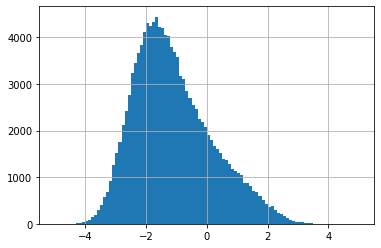

In [9]:
score.wealthy.hist(bins=100)

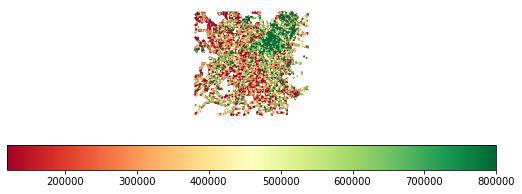

In [10]:
# set a variable that will call whatever column we want to visualise on the map
variable ='wealthy'# set the range for the choropleth

vmin, vmax = 120000, 800000# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(10, 3))


# fig, ax = plt.subplots(1,1,figsize = (20,12))
score.plot(ax=ax,
           figsize=(8,4),
           column=variable,
           marker='.',
           markersize=3,
           cmap='RdYlGn',
          scheme='quantiles')
# remove the axis
ax.axis('off')

# # add a title
# ax.set_title(‘Population of Rajasthan’, fontdict={‘fontsize’: ‘25’, ‘fontweight’ : ‘3’})
# # create an annotation for the data source
# ax.annotate(‘Source: Rajasthan Datastore, 2019’,xy=(0.1, .08), xycoords=’figure fraction’,
#             horizontalalignment=’left’, verticalalignment=’top’, fontsize=12, color=’#555555')
            
# fig.set_facecolor("#343536")

vmin, vmax = 120000, 800000
# Create colorbar as a legend
sm = plt.cm.ScalarMappable(cmap='RdYlGn', norm=plt.Normalize(vmin=vmin, vmax=vmax))

# empty array for the data range
sm._A = []

# add the colorbar to the figure
cbar = fig.colorbar(sm, orientation='horizontal', format='%.0f')

#saving our map as .png file.
# fig.savefig(‘map_export.png’, dpi=300)


# scheme='QUANTILES'
# cmap='RdYlGn',

In [11]:
L = ax.get_legend()

## MAPAS WEKUN

In [2]:
# score1 = pd.read_csv('puntajes_live.csv')
# score2 = pd.read_csv('puntajes_walk.csv')
score3 = pd.read_csv('puntajes_safety_OD.csv')
# score4 = pd.read_csv('puntajes_beauty.csv')
# score5 = pd.read_csv('puntajes_wealthy.csv')

In [3]:
score3

,Unnamed: 0,ID,Utilidad_male,Utilidad_female,Utilidad_pedestrian,Utilidad_bike,Utilidad_PT,Utilidad_car,Utilidad_OD
0,0,"-33.323944,-70.51263428391168",3.696734,3.183997,3.699778,3.668958,3.699314,2.776589,3.223736
1,1,"-33.323944,-70.5127291",3.753128,3.294236,3.935767,3.778827,3.819058,2.765525,3.341979
2,2,"-33.323944,-70.51298714285714",4.063147,3.675854,4.143802,3.983864,4.131509,3.232608,3.645334
3,3,"-33.323944,-70.51343609999999",3.685047,3.167897,5.082386,3.895684,4.063870,2.806048,3.346853
4,4,"-33.323944,-70.51379769565217",3.537364,2.535822,3.577750,3.692063,3.540796,2.683966,3.143030
...,...,...,...,...,...,...,...,...,...
126281,126281,"-33.67884090851735,-70.68059514195582",2.501214,2.037337,2.501420,2.332108,2.501388,1.725374,2.059656
126282,126282,"-33.67884090851735,-70.69912023659306",3.770969,3.272160,3.787936,3.785730,3.785350,3.206583,3.341146
126283,126283,"-33.67884090851735,-70.70653027444796",3.835170,3.423882,3.835170,3.863277,3.835170,3.530169,3.436854
126284,126284,"-33.67884090851735,-70.7176453312303",3.073325,2.541004,3.112770,2.912668,3.106758,3.036138,2.636880


In [4]:
utilidades = pd.concat([score1.Utilidad,
                       score2.Utilidad,
                       score3.Utilidad,
                       score4.Utilidad,
                       score5.Utilidad], axis=1)
utilidades.columns = ['live', 'walk','safety','beauty','wealthy']
round(utilidades.corr(),2)

NameError: name 'score1' is not defined

In [5]:
# %matplotlib inline
# grr = pd.plotting.scatter_matrix(utilidades, figsize=(15,15),marker='o',alpha=.4)
# plt.savefig('hola.png')

# MAPAS PAPER SAFETY

In [5]:
def get_gdf(path):
    score = pd.read_csv(path)
    score[0],score[1] = score['ID'].str.split(',',1).str
    score['lat'] = score[0]
    score['long'] = score[1]
    score = score.astype({'lat':float,
                          'long':float})

    ## Crear una columna nueva
    score['Coordinates'] = list(zip(score.long, score.lat))
    ## Convertir la columna en shape type Points
    score['Coordinates'] = score['Coordinates'].apply(Point)
    pics = gpd.GeoDataFrame(score.copy(), geometry='Coordinates')
#     pics.loc[:,'P_female'] = -1*pics.loc[:,'D_female']/score['Utilidad']*100
#     pics.loc[:,'P_bike'] = -1*pics.loc[:,'D_bike']/score['Utilidad']*100
#     pics.loc[:,'P_pedestrian'] = -1*pics.loc[:,'D_pedestrian']/score['Utilidad']*100
#     pics.loc[:,'P_PT'] = -1*pics.loc[:,'D_PT']/score['Utilidad']*100
#     pics.loc[:,'P_car'] = -1*pics.loc[:,'D_car']/score['Utilidad']*100
    
    pics.crs = {'init': 'epsg:4326'}
    pics['Coordinates'] = pics['Coordinates'].to_crs(epsg=32719)
    return pics

In [6]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
def plot_mapa(modelo,variable):
    
    fig, ax = plt.subplots(1,1,figsize = (10,15))
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    modelo.plot(ax=ax,cax=cax,
               column=variable,
               marker='.',
               markersize=7,
               cmap='RdYlGn',
               scheme='QUANTILES', k=5,
               legend=False, alpha=0.6)


    ax.axis('off')
#     fig.set_facecolor("#343536")
    
    vmin, vmax = -100, 100
    # Create colorbar as a legend
    sm = plt.cm.ScalarMappable(cmap='RdYlGn', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    # empty array for the data range
    sm._A = []
    # add the colorbar to the figure
    cbar = fig.colorbar(sm, orientation='vertical', format='%.0f', cax=cax)


In [7]:
# os.chdir('02 Stgo')
os.listdir()

['.ipynb_checkpoints',
 '00 Actualizar Features PP.ipynb',
 '01 Actualizar respuestas Wekun.ipynb',
 '02 Preparar data para aplicacion.ipynb',
 '03 Analisis DB.ipynb',
 '04 Analisis Error Segnet.ipynb',
 '05 Aplicacion Walk.ipynb',
 '06 Aplicacion Live.ipynb',
 '07 Aplicacion Safety.ipynb',
 '08 Aplicacion Beauty.ipynb',
 '09 Aplicacion Wealthy.ipynb',
 'Calcular atributos cuali imagenes.ipynb',
 'features_imagenes.csv',
 'headers.py',
 'Indicadores psicométricos.gdoc',
 'mapa.ipynb',
 'puntajes_safety_BASE.csv',
 'puntajes_safety_OD.csv',
 'wekun_object_detection.py',
 '__pycache__']

In [8]:
# walk = get_gdf('puntajes_walk.csv')
# live = get_gdf('puntajes_live.csv')
safety = get_gdf('puntajes_safety_OD.csv')
# beauty = get_gdf('puntajes_beauty.csv')
# wealthy = get_gdf('puntajes_wealthy.csv')

In [9]:
safety.head()

,Unnamed: 0,ID,Utilidad_male,Utilidad_female,Utilidad_pedestrian,Utilidad_bike,Utilidad_PT,Utilidad_car,Utilidad_OD,0,1,lat,long,Coordinates
0,0,"-33.323944,-70.51263428391168",3.696734,3.183997,3.699778,3.668958,3.699314,2.776589,3.223736,-33.323944,-70.51263428391168,-33.323944,-70.512634,POINT (359208.106 6311778.516)
1,1,"-33.323944,-70.5127291",3.753128,3.294236,3.935767,3.778827,3.819058,2.765525,3.341979,-33.323944,-70.5127291,-33.323944,-70.512729,POINT (359199.280 6311778.388)
2,2,"-33.323944,-70.51298714285714",4.063147,3.675854,4.143802,3.983864,4.131509,3.232608,3.645334,-33.323944,-70.51298714285714,-33.323944,-70.512987,POINT (359175.260 6311778.039)
3,3,"-33.323944,-70.51343609999999",3.685047,3.167897,5.082386,3.895684,4.063870,2.806048,3.346853,-33.323944,-70.51343609999999,-33.323944,-70.513436,POINT (359133.468 6311777.433)
4,4,"-33.323944,-70.51379769565217",3.537364,2.535822,3.577750,3.692063,3.540796,2.683966,3.143030,-33.323944,-70.51379769565217,-33.323944,-70.513798,POINT (359099.809 6311776.944)


In [10]:
safety.describe()

,Unnamed: 0,Utilidad_male,Utilidad_female,Utilidad_pedestrian,Utilidad_bike,Utilidad_PT,Utilidad_car,Utilidad_OD,lat,long
count,126286.000000,126286.000000,126286.000000,126286.000000,126286.000000,126286.000000,126286.000000,126286.000000,126286.000000,126286.000000
mean,63142.500000,3.776284,3.202575,4.062896,3.852115,3.959705,3.087863,3.379865,-33.480567,-70.651286
std,36455.772385,0.598043,0.615205,0.688602,0.643189,0.634804,0.641229,0.585364,0.078828,0.082378
min,0.000000,-0.502750,-1.083456,-0.502750,-0.502750,-0.502750,-0.502750,-1.004080,-33.678841,-70.848556
25%,31571.250000,3.371597,2.807232,3.600103,3.406757,3.532560,2.644894,2.978240,-33.541094,-70.712811
50%,63142.500000,3.756492,3.202806,4.025470,3.820464,3.939566,3.056515,3.356683,-33.475797,-70.649080
75%,94713.750000,4.167272,3.606832,4.492590,4.277620,4.371886,3.506590,3.765828,-33.417933,-70.582897
max,126285.000000,6.366838,5.633422,8.730444,6.511866,6.703756,5.802340,5.877116,-33.323944,-70.458294


In [11]:
safety.corr()

,Unnamed: 0,Utilidad_male,Utilidad_female,Utilidad_pedestrian,Utilidad_bike,Utilidad_PT,Utilidad_car,Utilidad_OD,lat,long
Unnamed: 0,1.000000,-0.232220,-0.135495,-0.241061,-0.242019,-0.239299,-0.199214,-0.219539,-0.995173,-0.046975
Utilidad_male,-0.232220,1.000000,0.940365,0.915768,0.967003,0.975026,0.950026,0.995245,0.221200,0.156428
Utilidad_female,-0.135495,0.940365,1.000000,0.835100,0.880259,0.914578,0.883182,0.940232,0.127508,0.135076
Utilidad_pedestrian,-0.241061,0.915768,0.835100,1.000000,0.918006,0.953401,0.877209,0.921597,0.231923,0.165165
Utilidad_bike,-0.242019,0.967003,0.880259,0.918006,1.000000,0.948275,0.916845,0.978927,0.230800,0.164825
Utilidad_PT,-0.239299,0.975026,0.914578,0.953401,0.948275,1.000000,0.930023,0.972698,0.229600,0.165553
Utilidad_car,-0.199214,0.950026,0.883182,0.877209,0.916845,0.930023,1.000000,0.945962,0.187376,0.150810
Utilidad_OD,-0.219539,0.995245,0.940232,0.921597,0.978927,0.972698,0.945962,1.000000,0.208990,0.160963
lat,-0.995173,0.221200,0.127508,0.231923,0.230800,0.229600,0.187376,0.208990,1.000000,0.039602
long,-0.046975,0.156428,0.135076,0.165165,0.164825,0.165553,0.150810,0.160963,0.039602,1.000000


Text(0.5, 0, 'Score')

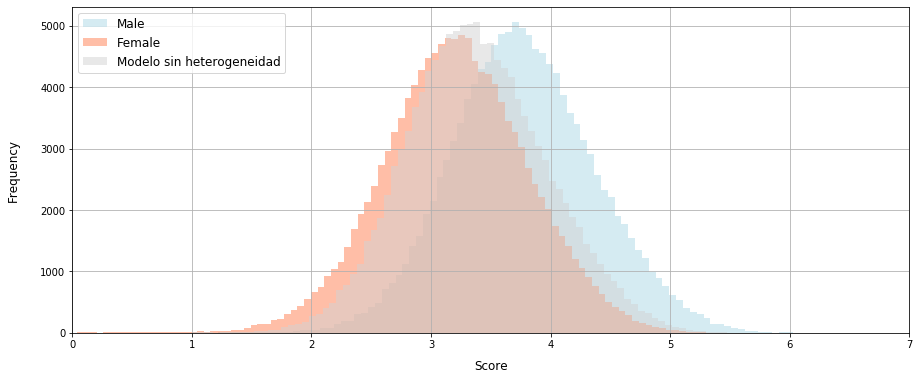

In [12]:
fig, ax = plt.subplots(1,1,figsize = (15,6))
safety.Utilidad_male.hist(ax=ax,bins=120,alpha=0.5,color='lightblue', label='Male')
safety.Utilidad_female.hist(ax=ax,bins=120,alpha=0.5,color='coral', label='Female')
safety.Utilidad_OD.hist(ax=ax,bins=120,alpha=0.5,color='lightgrey', label='Modelo sin heterogeneidad')
leg = ax.legend()

plt.xlim(0,7)

ax.legend(loc='upper left', fontsize=12)
plt.ylabel("Frequency", fontsize=12, labelpad=20)
plt.xlabel("Score", fontsize=12, labelpad=10)

In [31]:
import cartopy.crs as ccrs
import numpy as np

def scale_bar(ax, length=None, location=(0.5, 0.05), linewidth=3):
    """
    ax is the axes to draw the scalebar on.
    length is the length of the scalebar in km.
    location is center of the scalebar in axis coordinates.
    (ie. 0.5 is the middle of the plot)
    linewidth is the thickness of the scalebar.
    """
    #Get the limits of the axis in lat long
    llx0, llx1, lly0, lly1 = ax.get_extent(ccrs.PlateCarree())
    #Make tmc horizontally centred on the middle of the map,
    #vertically at scale bar location
    sbllx = (llx1 + llx0) / 2
    sblly = lly0 + (lly1 - lly0) * location[1]
    tmc = ccrs.TransverseMercator(sbllx, sblly)
    #Get the extent of the plotted area in coordinates in metres
    x0, x1, y0, y1 = ax.get_extent(tmc)
    #Turn the specified scalebar location into coordinates in metres
    sbx = x0 + (x1 - x0) * location[0]
    sby = y0 + (y1 - y0) * location[1]

    #Calculate a scale bar length if none has been given
    #(Theres probably a more pythonic way of rounding the number but this works)
    if not length: 
        length = (x1 - x0) / 5000 #in km
        ndim = int(np.floor(np.log10(length))) #number of digits in number
        length = round(length, -ndim) #round to 1sf
        #Returns numbers starting with the list
        def scale_number(x):
            if str(x)[0] in ['1', '2', '5']: return int(x)        
            else: return scale_number(x - 10 ** ndim)
        length = scale_number(length) 

    #Generate the x coordinate for the ends of the scalebar
    bar_xs = [sbx - length * 500, sbx + length * 500]
    #Plot the scalebar
    ax.plot(bar_xs, [sby, sby], transform=tmc, color='k', linewidth=linewidth)
    #Plot the scalebar label
    ax.text(sbx, sby, str(length) + ' km', transform=tmc,
            horizontalalignment='center', verticalalignment='bottom')

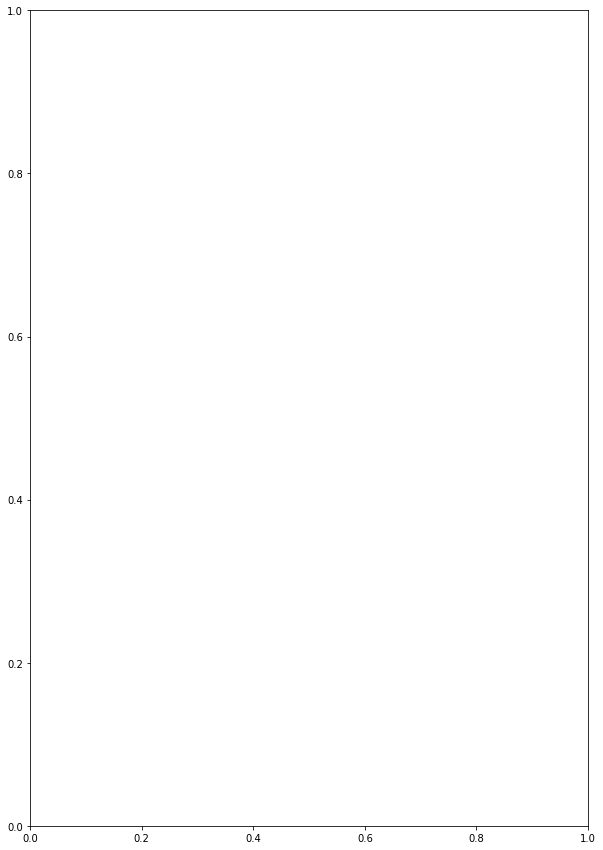

In [44]:
fig, ax = plt.subplots(1,1,figsize = (10,15))


Help on GeoAxesSubplot in module cartopy.mpl.geoaxes object:

class GeoAxesSubplot(matplotlib.axes._subplots.SubplotBase, GeoAxes)
 |  GeoAxesSubplot(fig, *args, **kwargs)
 |  
 |  Base class for subplots, which are :class:`Axes` instances with
 |  additional methods to facilitate generating and manipulating a set
 |  of :class:`Axes` within a figure.
 |  
 |  Method resolution order:
 |      GeoAxesSubplot
 |      matplotlib.axes._subplots.SubplotBase
 |      GeoAxes
 |      matplotlib.axes._axes.Axes
 |      matplotlib.axes._base._AxesBase
 |      matplotlib.artist.Artist
 |      builtins.object
 |  
 |  Methods inherited from matplotlib.axes._subplots.SubplotBase:
 |  
 |  __init__(self, fig, *args, **kwargs)
 |      *fig* is a :class:`matplotlib.figure.Figure` instance.
 |      
 |      *args* is the tuple (*numRows*, *numCols*, *plotNum*), where
 |      the array of subplots in the figure has dimensions *numRows*,
 |      *numCols*, and where *plotNum* is the number of the subplot

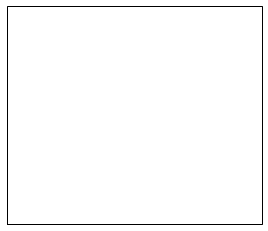

In [47]:
ax = plt.axes(projection=ccrs.Mercator())
help(ax)

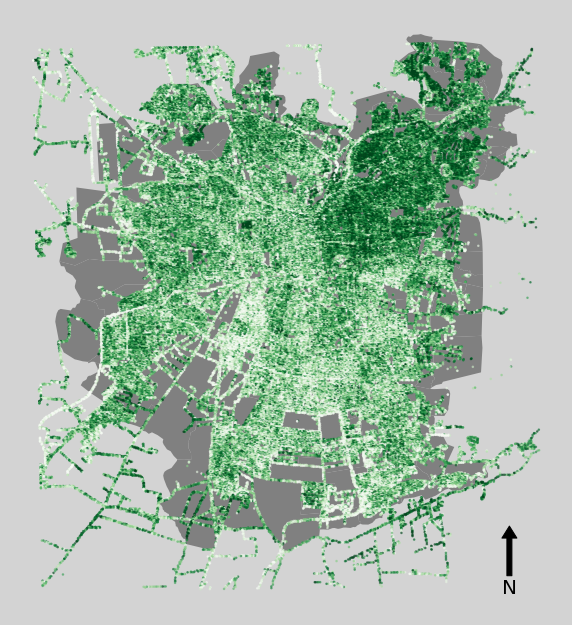

In [83]:
fig, ax = plt.subplots(1,1,figsize = (10,15))

# ax = plt.axes(projection=ccrs.Mercator())
# ax.set_extent([31, 35.5, 34, 36], ccrs.Geodetic())

# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.1)
base.plot(ax=ax, color='grey')
safety.plot(ax=ax,
            column='Utilidad_male',
            marker='.',
            markersize=10,
            cmap='Greens',
            scheme='quantiles', k=10,
            legend=False,
            alpha=0.5)

ax.axis('off')
fig.set_facecolor("lightgray")
# fig.set_facecolor("#848586")

x, y, arrow_length = 0.9, 0.15, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)



plt.show()

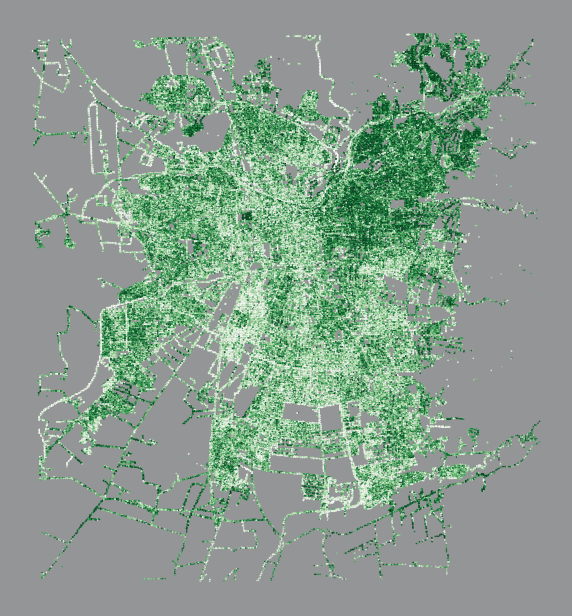

In [84]:
fig, ax = plt.subplots(1,1,figsize = (10,15))
# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.1)
safety.plot(ax=ax,
            column='Utilidad_female',
            marker='.',
            markersize=1,
            cmap='Greens',
            scheme='quantiles', k=10,
            legend=False,
            alpha=0.9)

ax.axis('off')
fig.set_facecolor("#949596")

# vmin, vmax = 0, 7
# # Create colorbar as a legend
# sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
# # empty array for the data range
# sm._A = []
# # add the colorbar to the figure
# cbar = fig.colorbar(sm, orientation='vertical', format='%.0f', cax=cax)

In [86]:
stats = safety.describe()
stats(stats.loc['mean','Utilidad_male'] - stats.loc['mean','Utilidad_female'])/stats.loc['std','Utilidad_female']

TypeError: 'DataFrame' object is not callable

Text(0.5, 0, 'Percentage difference')

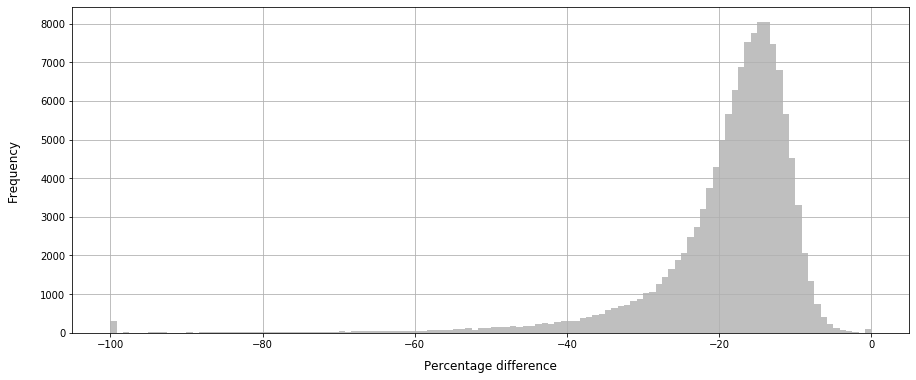

In [87]:
fig, ax = plt.subplots(1,1,figsize = (15,6))
dif_sex = (safety.Utilidad_female - safety.Utilidad_male)/safety.Utilidad_female*100
dif_sex = np.clip(dif_sex,-100,0)
dif_sex.hist(ax=ax,bins=120,alpha=0.5,color='grey')

plt.ylabel("Frequency", fontsize=12, labelpad=20)
plt.xlabel("Percentage difference", fontsize=12, labelpad=10)

In [88]:
dif_sex.describe()

count    126286.000000
mean        -18.936888
std          10.111662
min        -100.000000
25%         -21.362113
50%         -16.541948
75%         -13.192131
max           0.000000
dtype: float64

In [89]:
from scipy import stats
dif_sex.quantile(.20)
# stats.percentileofscore(dif_sex,-25)

-23.034156908249653

In [90]:
dif_sex.name = 'D_sex'
safety = pd.concat([safety,dif_sex], axis=1)
# safety = safety.drop(columns='D_sex')

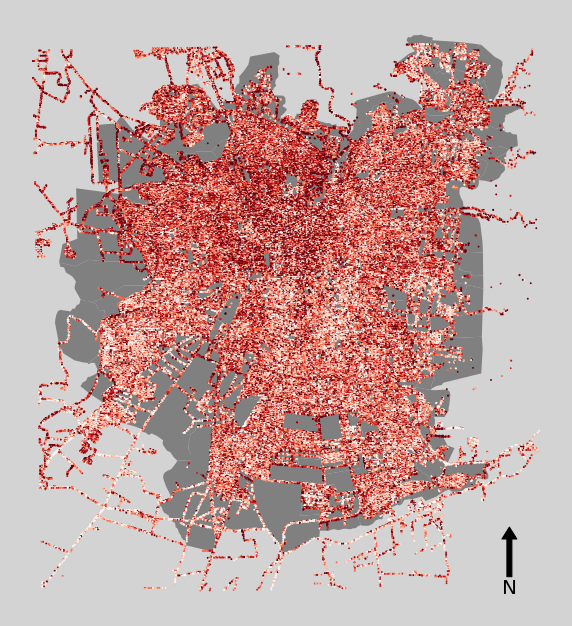

In [93]:
fig, ax = plt.subplots(1,1,figsize = (10,15))
# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.1)
# safety.plot(ax=ax,
#             marker='.',
#             markersize=5,
#             color = 'lightgrey')
base.plot(ax=ax, color='grey')
safety.plot(ax=ax,
            column='D_sex',
            marker='.',
            markersize=3,
            scheme='quantiles', k=5,
            cmap=plt.cm.get_cmap('Reds_r'),
            legend=False)

ax.axis('off')

fig.set_facecolor("lightgrey")

x, y, arrow_length = 0.9, 0.15, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)

plt.show()

# vmin, vmax = -100, 0
# # Create colorbar as a legend
# sm = plt.cm.ScalarMappable(cmap=plt.cm.get_cmap('Reds_r'), norm=plt.Normalize(vmin=vmin, vmax=vmax))
# # empty array for the data range
# sm._A = []
# # add the colorbar to the figure
# cbar = fig.colorbar(sm, orientation='vertical', format='%.0f', cax=cax)


#  'NaturalBreaks'
# 'boxplot',
#'equalinterval', 
# 'fisherjenks', NO TERMINA DE CORRER NUNCA
# 'fisherjenkssampled',
# 'headtailbreaks',
# 'jenkscaspall',
# 'jenkscaspallforced',
# 'jenkscaspallsampled',
# 'maxp',
# 'maximumbreaks',
# 'naturalbreaks',
# 'quantiles', k=5,
# 'percentiles',
# 'stdmean',
# 'userdefined'

In [ ]:
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
vmin, vmax = 0, 6
# Create colorbar as a legend
sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
# empty array for the data range
sm._A = []
# add the colorbar to the figure
cbar = fig.colorbar(sm, orientation='vertical', format='%.0f', cax=cax)

Text(0.5, 0, 'Score')

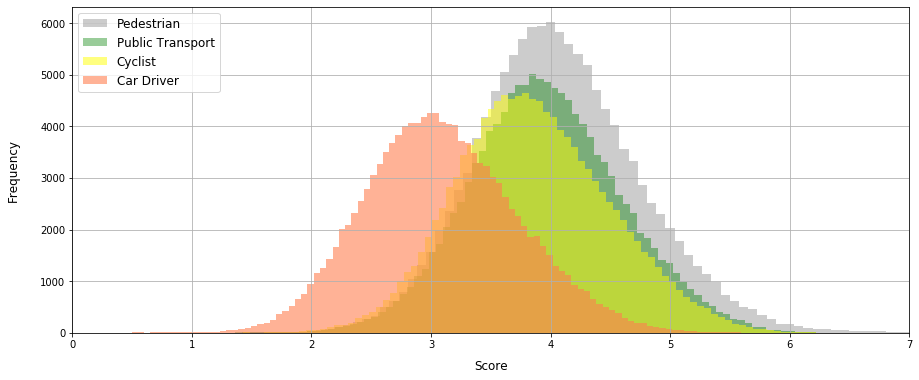

In [11]:
fig, ax = plt.subplots(1,1,figsize = (15,6))
# safety.Utilidad_OD.hist(ax=ax,bins=120,alpha=0.5,color='black', label='Modelo sin heterogeneidad')
safety.Utilidad_pedestrian.hist(ax=ax,bins=120,alpha=0.4,color='grey', label='Pedestrian')
safety.Utilidad_PT.hist(ax=ax,bins=120,alpha=0.4,color='green', label='Public Transport')
safety.Utilidad_bike.hist(ax=ax,bins=120,alpha=0.5,color='yellow', label='Cyclist')
safety.Utilidad_car.hist(ax=ax,bins=120,alpha=0.6,color='coral', label='Car Driver')

plt.xlim(0,7)

leg = ax.legend()

ax.legend(loc='upper left', fontsize=12)
plt.ylabel("Frequency", fontsize=12, labelpad=20)
plt.xlabel("Score", fontsize=12, labelpad=10)

Text(0.5, 0, 'Percentage difference')

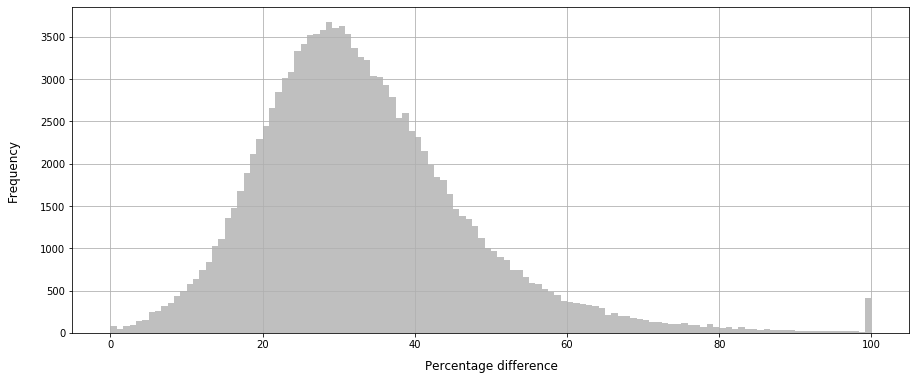

In [95]:
fig, ax = plt.subplots(1,1,figsize = (15,6))
dif_mode = -(safety.Utilidad_car - safety.Utilidad_pedestrian)/safety.Utilidad_car*100
dif_mode = np.clip(dif_mode,0,100)
dif_mode.hist(ax=ax,bins=120,alpha=0.5,color='grey')

plt.ylabel("Frequency", fontsize=12, labelpad=20)
plt.xlabel("Percentage difference", fontsize=12, labelpad=10)

In [96]:
dif_mode.describe()

count    126286.000000
mean         33.278549
std          14.090458
min           0.000000
25%          23.931653
50%          31.399936
75%          40.436052
max         100.000000
dtype: float64

In [97]:
dif_mode.quantile(0.8)

43.010775859300274

In [98]:
# -2 * (-4089.10 - -4072.24) 
# LR = 33.72
# Chi2 (a=0.05, k=5) = 11.07

# -2*(-4072.24--4040.37)
# LR = 63.74
# k = 39 - 26 = 13
# Chi2 (a=0.05, k=13) = 22.36

In [99]:
dif_mode.name = 'D_mode'
safety = pd.concat([safety,dif_mode], axis=1)

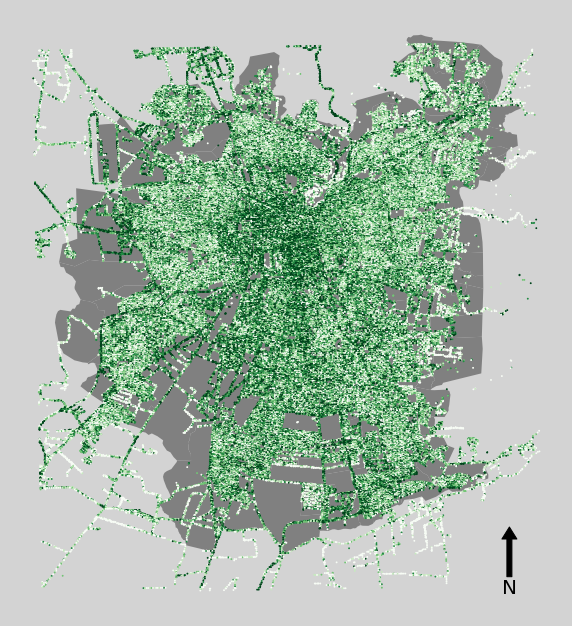

In [100]:
fig, ax = plt.subplots(1,1,figsize = (10,15))
# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.1)
# safety.plot(ax=ax,
#             marker='.',
#             markersize=5,
#             color = 'lightgrey')

base.plot(ax=ax, color='grey')
safety.plot(ax=ax,
            column='D_mode',
            marker='.',
            markersize=3,
            scheme='quantiles', k=5,
            cmap='Greens',
            legend=False)

ax.axis('off')

fig.set_facecolor("lightgrey")

x, y, arrow_length = 0.9, 0.15, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)

plt.show()

In [25]:
def plot_mapa_mejora(modelo,variable):
    aux = modelo
    fig, ax = plt.subplots(1,1,figsize = (10,15))
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    aux.plot(ax=ax,cax=cax,
               marker='.',
               markersize=3,
               color='grey',
               legend=False)   
    
    aux.loc[:,variable] = np.clip(aux.loc[:,variable],0,100)
    aux.loc[:,variable].replace(0,np.nan)

    aux.plot(ax=ax,cax=cax,
               column=variable,
               marker='.',
               markersize=3,
               cmap='Greens',
               scheme='QUANTILES', k=5,
               legend=False, alpha=0.5)


    ax.axis('off')
#     fig.set_facecolor("#343536")
    
    vmin, vmax = 0, 100
    # Create colorbar as a legend
    sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    # empty array for the data range
    sm._A = []
    # add the colorbar to the figure
    cbar = fig.colorbar(sm, orientation='vertical', format='%.0f', cax=cax)
    
def plot_mapa_empeora(modelo,variable):
    aux = modelo
    fig, ax = plt.subplots(1,1,figsize = (10,15))
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    aux.plot(ax=ax,cax=cax,
               marker='.',
               markersize=3,
               color='grey',
               legend=False)   
    
    aux.loc[:,variable] = -1*np.clip(aux.loc[:,variable],-100,0)
    aux.loc[:,variable].replace(0,np.nan)

    aux.plot(ax=ax,cax=cax,
               column=variable,
               marker='.',
               markersize=3,
               cmap='Reds',
               scheme='QUANTILES', k=3,
               legend=False, alpha=0.5)


    ax.axis('off')
#     fig.set_facecolor("#343536")
    
    vmin, vmax = -100, 0
    # Create colorbar as a legend
    sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    # empty array for the data range
    sm._A = []
    # add the colorbar to the figure
    cbar = fig.colorbar(sm, orientation='vertical', format='%.0f', cax=cax)

Text(0.5, 0, 'Porcentaje')

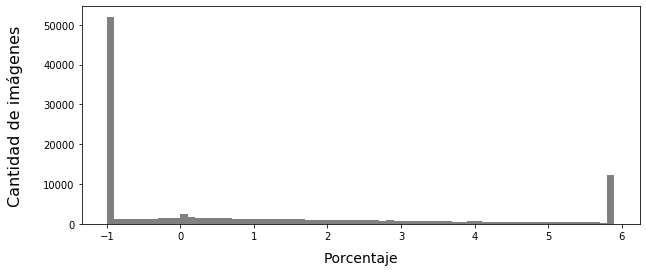

In [255]:
data = walk.loc[:,'P_female'].values 
bins = np.arange(-1,6,0.1)
fig, ax = plt.subplots(figsize=[10,4])
_, bins, patches = plt.hist(np.clip(data, bins[0], bins[-1]), bins=bins, color=['grey'])
plt.ylabel("Cantidad de imágenes", fontsize=16, labelpad=20)
plt.xlabel("Porcentaje", fontsize=14, labelpad=10)

In [ ]:
var = 'P_female'


plt.figure(figsize=[10,20])
# plt.suptitle('Hist edades usuarios')

plt.subplot(121)
plt.title("Sexo masculino", fontsize=16, pad=20)
plt.hist(df[(df['gender']==0)]['age'], bins=nbins, color=['Grey'], rwidth = 1)
plt.ylim(0, y_lim)
plt.xlim(0, 80)
plt.ylabel("Cantidad de respuestas", fontsize=16, labelpad=20)
plt.xlabel("Edad", fontsize=14, labelpad=10)
plt.xticks(size = 14)
plt.yticks(size = 14)
# plt.tick_params(axis='both', which='major', pad=15)
# plt.label_params(axis='both', which='major', pad=15)

plt.subplot(122)
plt.title("Sexo femenino", fontsize=16, pad=20)
plt.hist(df[(df['gender']==1)]['age'], bins=nbins,color=['Grey'], rwidth = 1)
plt.ylim(0, y_lim)
plt.xlim(0, 80)
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.xlabel("Edad", fontsize=14, labelpad=10)

# plt.subplot(133)
# plt.title("Sexo no binario")
# plt.hist(df[(df['gender']==99)]['age'], bins=nbins,color=['Grey'])
# plt.ylim(0, y_lim)
# plt.xlim(0, 80)
# plt.xlabel("Edad")


plt.show()

C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\mapclassify\classifiers.py:138: UserWarning: Warning: Not enough unique values in array to form k classes
  "Warning: Not enough unique values in array to form k classes", UserWarning
C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\mapclassify\classifiers.py:140: UserWarning: Warning: setting k to 1
  Warn("Warning: setting k to %d" % k_q, UserWarning)
C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\mapclassify\classifiers.py:804: RuntimeWarning: invalid value encountered in double_scalars
  gadf = 1 - self.adcm / adam


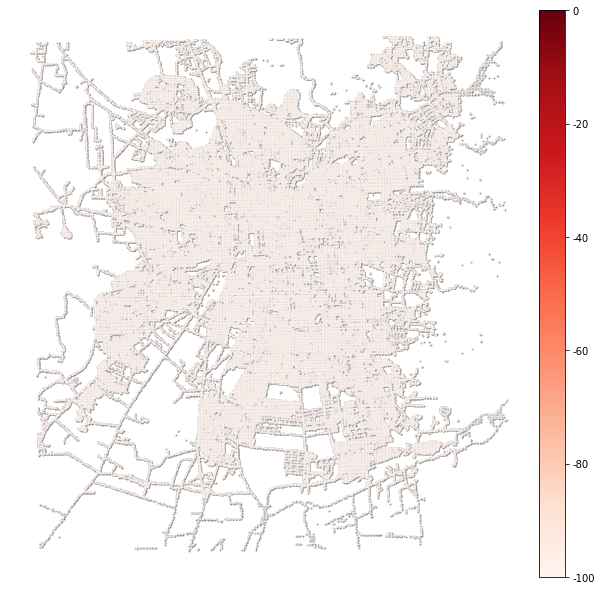

In [25]:
# plot_mapa_mejora(walk,   'P_female')
plot_mapa_empeora(walk,   'P_female')
# plot_mapa(live,   'P_female')
# plot_mapa(safety, 'P_female')
# plot_mapa(beauty, 'P_female')
# plot_mapa(wealthy,'P_female')


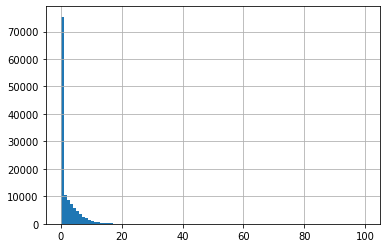

In [23]:
walk.P_female.hist(bins=100)

C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\mapclassify\classifiers.py:138: UserWarning: Warning: Not enough unique values in array to form k classes
  "Warning: Not enough unique values in array to form k classes", UserWarning
C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\mapclassify\classifiers.py:140: UserWarning: Warning: setting k to 3
  Warn("Warning: setting k to %d" % k_q, UserWarning)


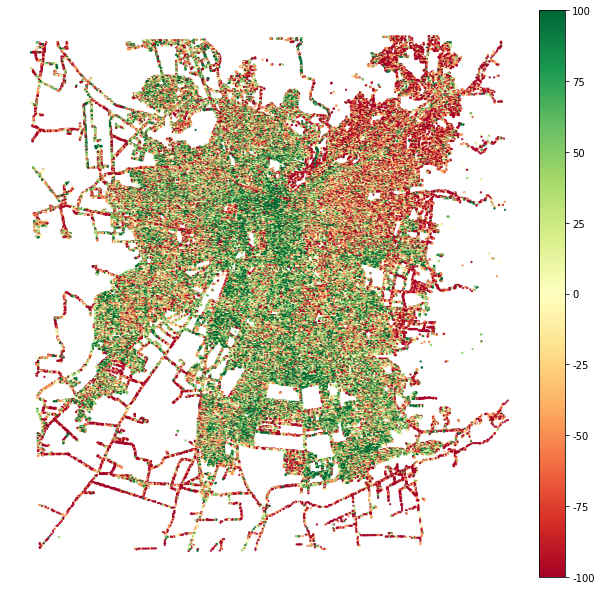

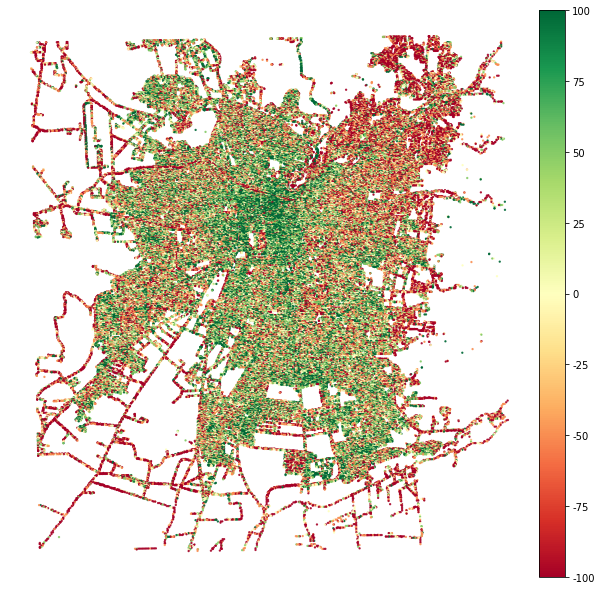

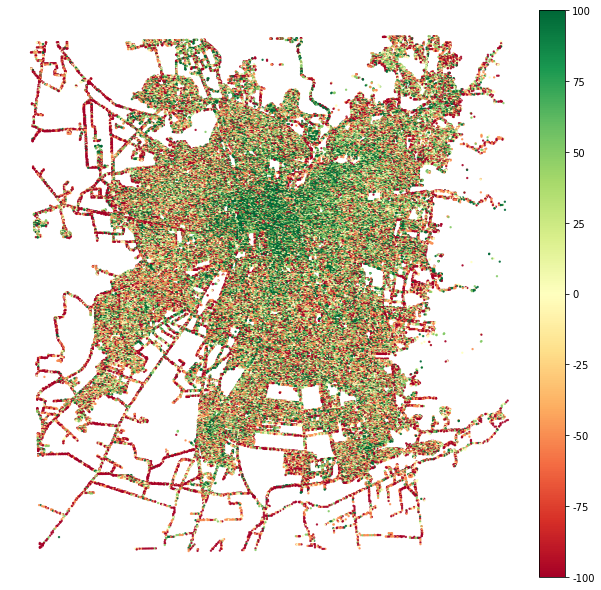

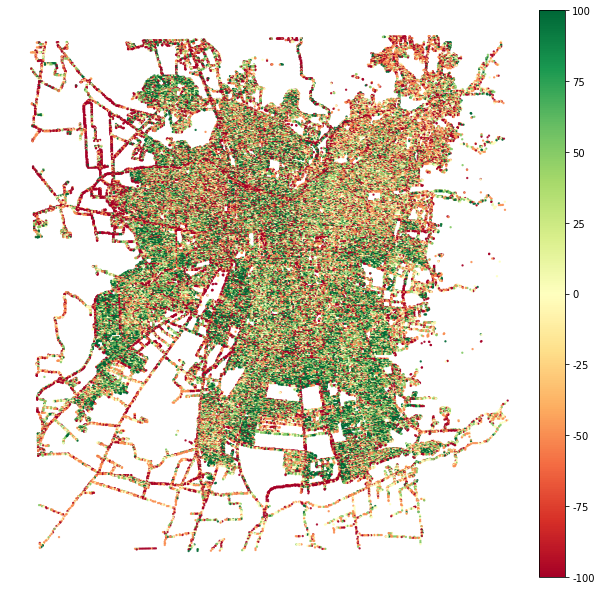

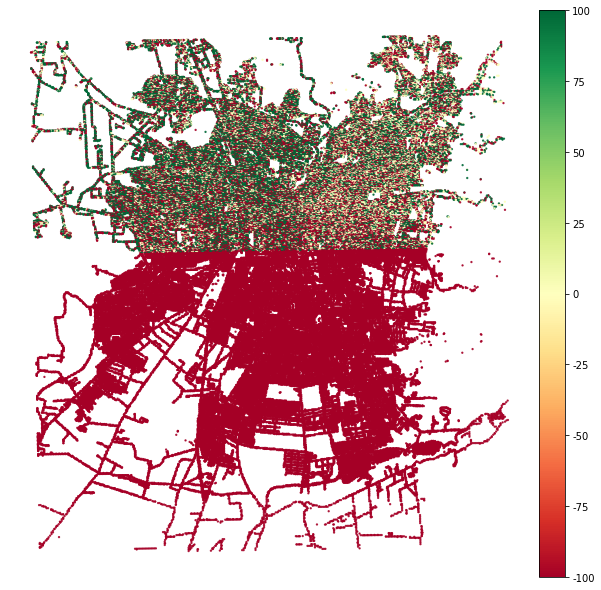

In [250]:
plot_mapa(walk,   'P_pedestrian')
plot_mapa(live,   'P_pedestrian')
plot_mapa(safety, 'P_pedestrian')
plot_mapa(beauty, 'P_pedestrian')
plot_mapa(wealthy,'P_pedestrian')

C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\mapclassify\classifiers.py:138: UserWarning: Warning: Not enough unique values in array to form k classes
  "Warning: Not enough unique values in array to form k classes", UserWarning
C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\mapclassify\classifiers.py:140: UserWarning: Warning: setting k to 1
  Warn("Warning: setting k to %d" % k_q, UserWarning)


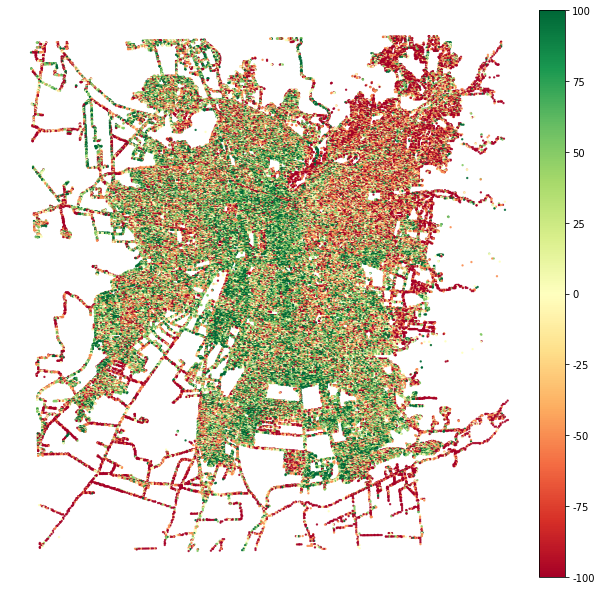

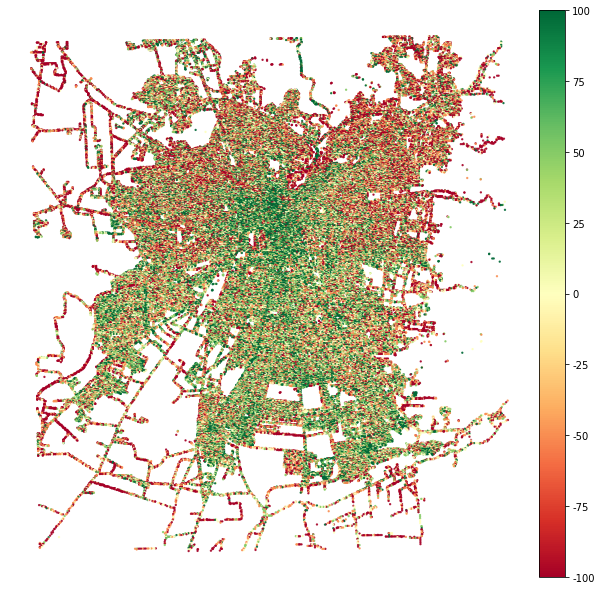

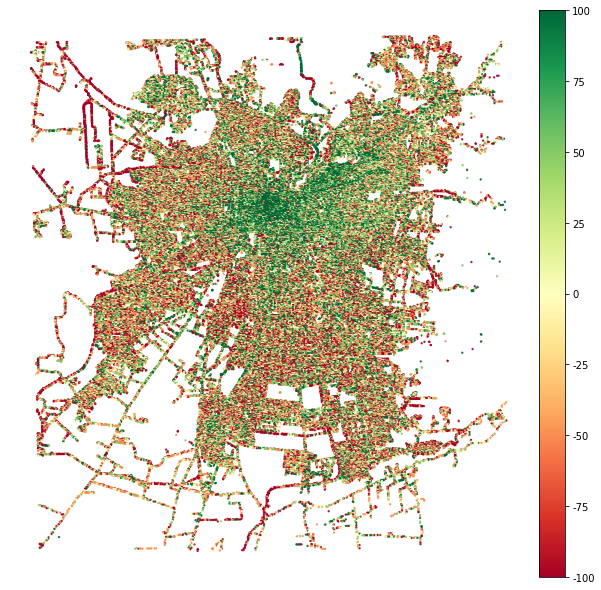

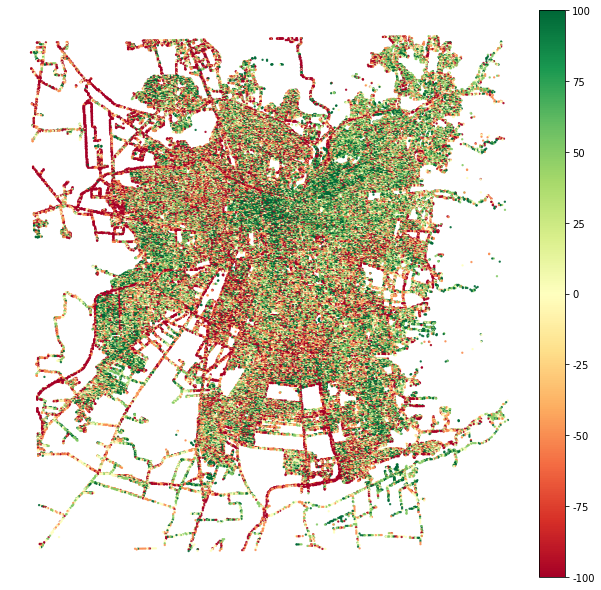

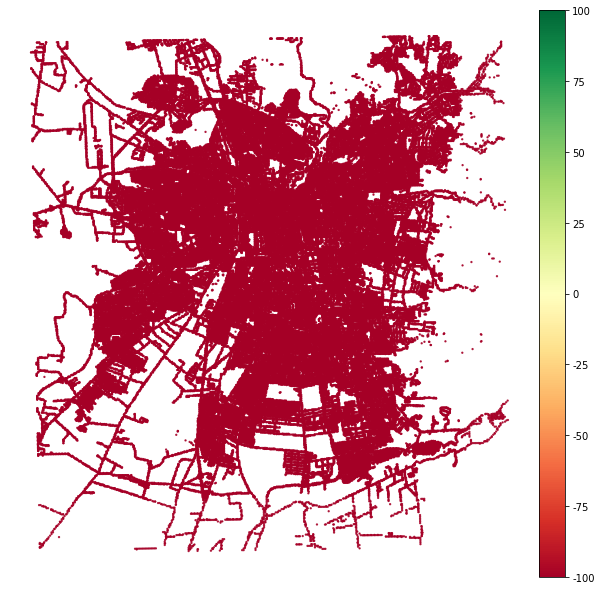

In [252]:
plot_mapa(walk,   'P_bike')
plot_mapa(live,   'P_bike')
plot_mapa(safety, 'P_bike')
plot_mapa(beauty, 'P_bike')
plot_mapa(wealthy,'P_bike')

C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\mapclassify\classifiers.py:138: UserWarning: Warning: Not enough unique values in array to form k classes
  "Warning: Not enough unique values in array to form k classes", UserWarning
C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\mapclassify\classifiers.py:140: UserWarning: Warning: setting k to 3
  Warn("Warning: setting k to %d" % k_q, UserWarning)


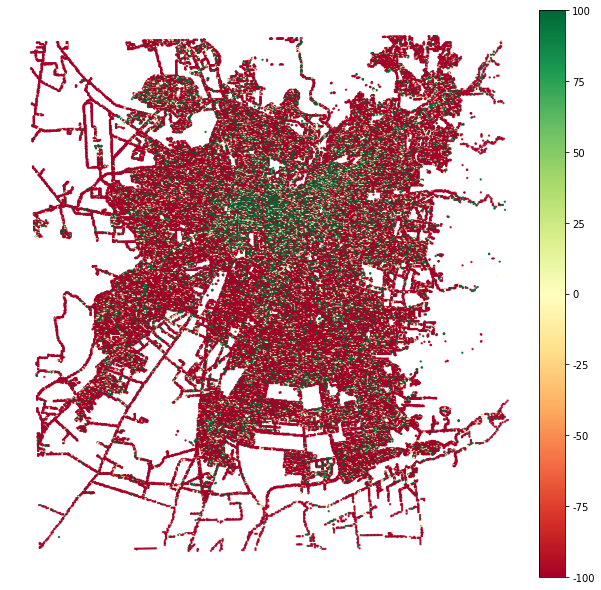

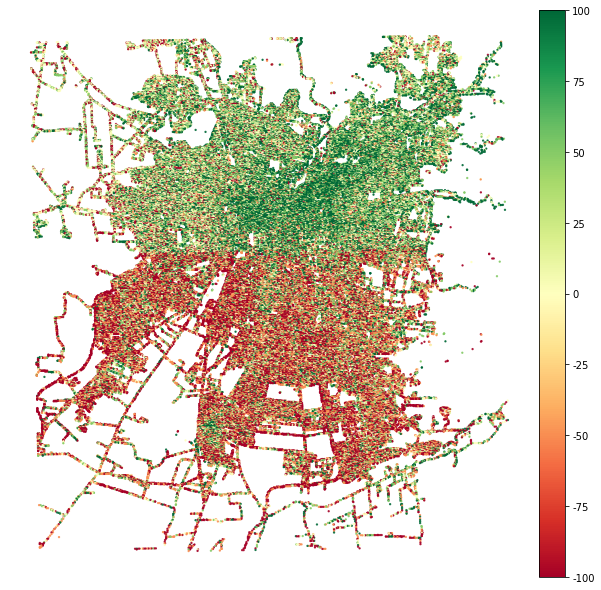

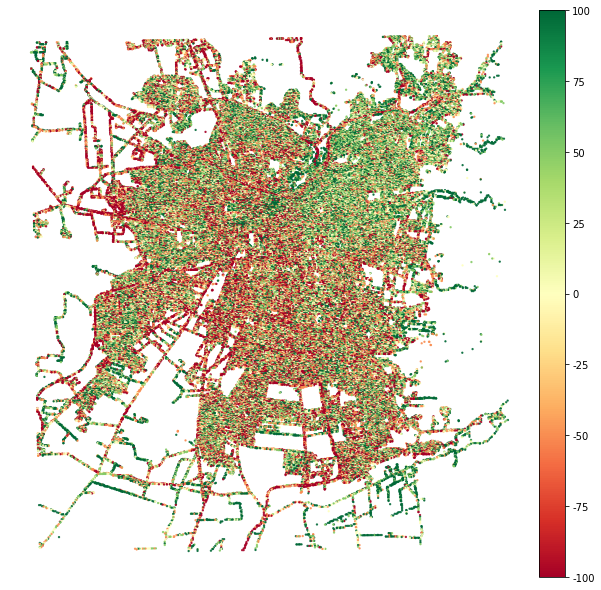

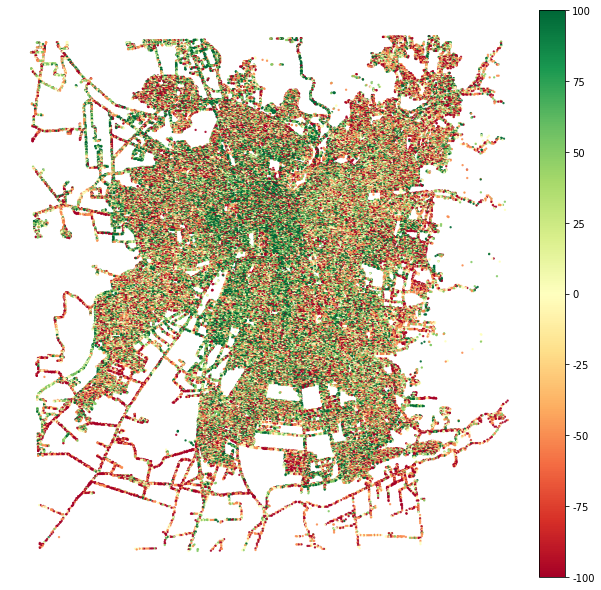

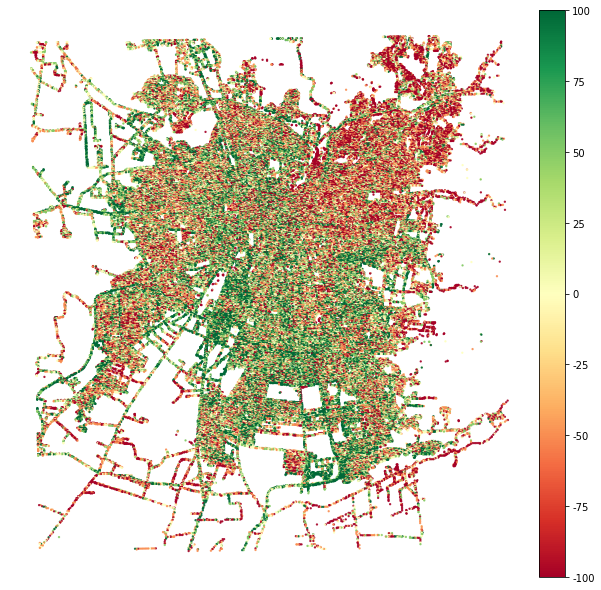

In [253]:
plot_mapa(walk,   'P_car')
plot_mapa(live,   'P_car')
plot_mapa(safety, 'P_car')
plot_mapa(beauty, 'P_car')
plot_mapa(wealthy,'P_car')

Text(0.5, 0, 'Porcentaje')

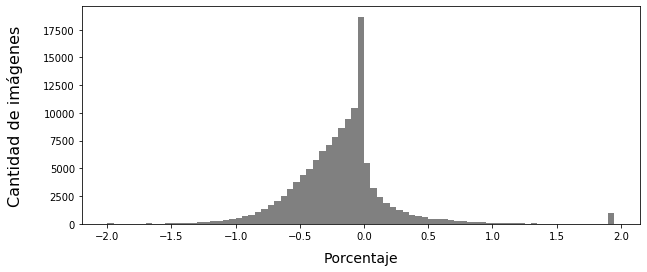

In [173]:
data = pics.loc[:,'P_female'].values 

bins = np.arange(-2,2,0.05)

fig, ax = plt.subplots(figsize=[10,4])
_, bins, patches = plt.hist(np.clip(data, bins[0], bins[-1]), bins=bins, color=['grey'])
#                             normed=1)  # normed is deprecated; replace with density
#                             density=True,
#                             color=['Lightgrey'],
#                             rwidth = 0.9)




# xlabels = [str(round(i,2)) for i in (bins[0:]).tolist()]
# # xlabels[-1] += '+'

N_labels = len(xlabels)
# plt.xlim([0, 80])
# plt.xticks(np.arange(N_labels)*0.5)
# ax.set_xticklabels(xlabels)
# for tick in ax.xaxis.get_major_ticks():
#     tick.label.set_fontsize(14) 
# for tick in ax.yaxis.get_major_ticks():
#     tick.label.set_fontsize(14) 

# # plt.yticks([])
# plt.title('')

plt.ylabel("Cantidad de imágenes", fontsize=16, labelpad=20)
plt.xlabel("Porcentaje", fontsize=14, labelpad=10)


Text(0.5, 0, 'Porcentaje')

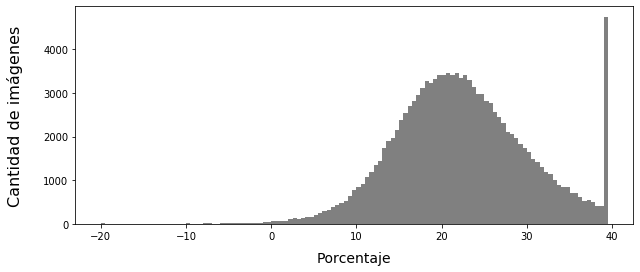

In [175]:
data = pics.loc[:,'P_bike'].values 
bins = np.arange(-20,40,0.5)
fig, ax = plt.subplots(figsize=[10,4])
_, bins, patches = plt.hist(np.clip(data, bins[0], bins[-1]), bins=bins, color=['grey'])
plt.ylabel("Cantidad de imágenes", fontsize=16, labelpad=20)
plt.xlabel("Porcentaje", fontsize=14, labelpad=10)


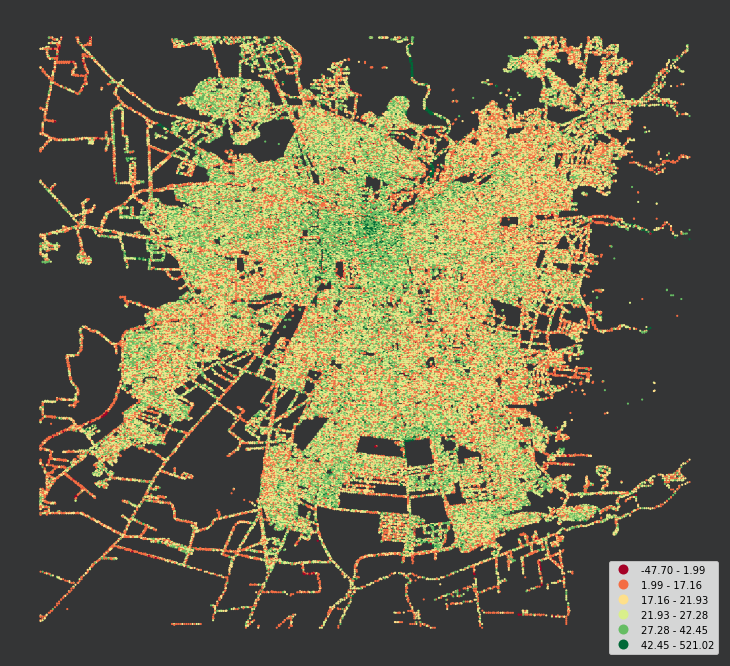

In [176]:
fig, ax = plt.subplots(1,1,figsize = (20,12))
pics.plot(ax=ax,
          column='P_bike',
           marker='.',
           markersize=5,
           cmap='RdYlGn',
           scheme='boxplot',
           legend=True)

ax.axis('off')
fig.set_facecolor("#343536")

Text(0.5, 0, 'Porcentaje')

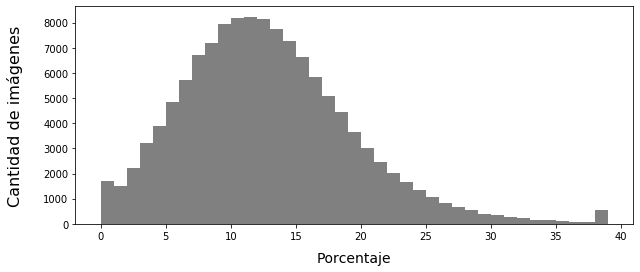

In [177]:
data = pics.loc[:,'P_pedestrian'].values 

bins = np.arange(0,40,1)

fig, ax = plt.subplots(figsize=[10,4])
_, bins, patches = plt.hist(np.clip(data, bins[0], bins[-1]), bins=bins, color=['grey'])
#                             normed=1)  # normed is deprecated; replace with density
#                             density=True,
#                             color=['Lightgrey'],
#                             rwidth = 0.9)




# xlabels = [str(round(i,2)) for i in (bins[0:]).tolist()]
# # xlabels[-1] += '+'

N_labels = len(xlabels)
# plt.xlim([0, 80])
# plt.xticks(np.arange(N_labels)*0.5)
# ax.set_xticklabels(xlabels)
# for tick in ax.xaxis.get_major_ticks():
#     tick.label.set_fontsize(14) 
# for tick in ax.yaxis.get_major_ticks():
#     tick.label.set_fontsize(14) 

# # plt.yticks([])
# plt.title('')

plt.ylabel("Cantidad de imágenes", fontsize=16, labelpad=20)
plt.xlabel("Porcentaje", fontsize=14, labelpad=10)


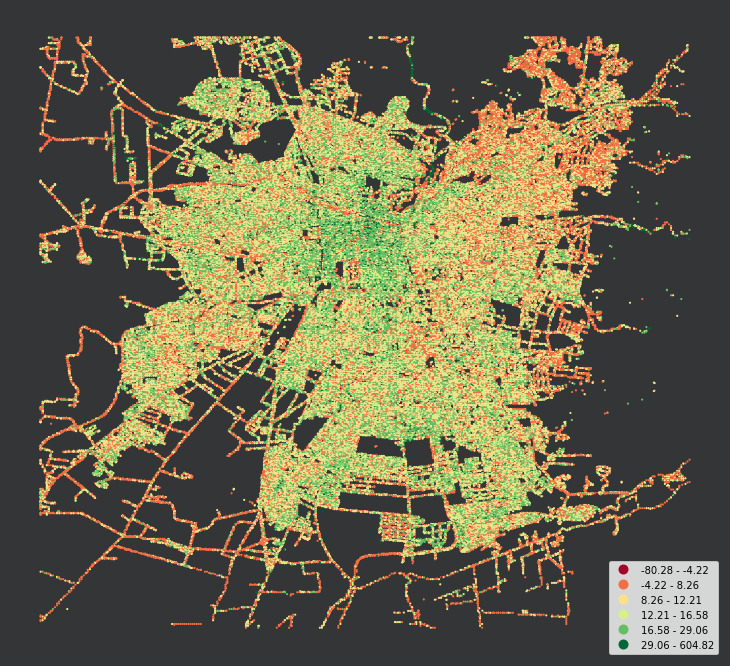

In [178]:
fig, ax = plt.subplots(1,1,figsize = (20,12))
pics.plot(ax=ax,
          column='P_pedestrian',
           marker='.',
           markersize=5,
           cmap='RdYlGn',
           scheme='boxplot',
           legend=True)

ax.axis('off')
fig.set_facecolor("#343536")

Text(0.5, 0, 'Porcentaje')

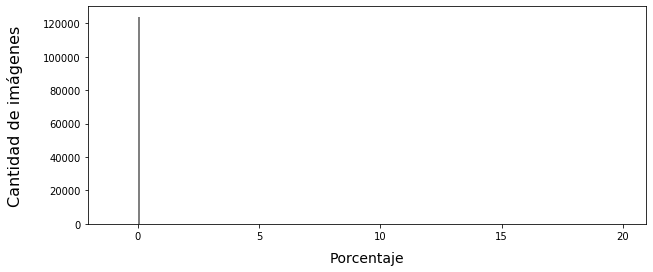

In [179]:
data = pics.loc[:,'P_PT'].values 

bins = np.arange(-1,20,0.10)

fig, ax = plt.subplots(figsize=[10,4])
_, bins, patches = plt.hist(np.clip(data, bins[0], bins[-1]), bins=bins, color=['grey'])
#                             normed=1)  # normed is deprecated; replace with density
#                             density=True,
#                             color=['Lightgrey'],
#                             rwidth = 0.9)




# xlabels = [str(round(i,2)) for i in (bins[0:]).tolist()]
# # xlabels[-1] += '+'

N_labels = len(xlabels)
# plt.xlim([0, 80])
# plt.xticks(np.arange(N_labels)*0.5)
# ax.set_xticklabels(xlabels)
# for tick in ax.xaxis.get_major_ticks():
#     tick.label.set_fontsize(14) 
# for tick in ax.yaxis.get_major_ticks():
#     tick.label.set_fontsize(14) 

# # plt.yticks([])
# plt.title('')

plt.ylabel("Cantidad de imágenes", fontsize=16, labelpad=20)
plt.xlabel("Porcentaje", fontsize=14, labelpad=10)


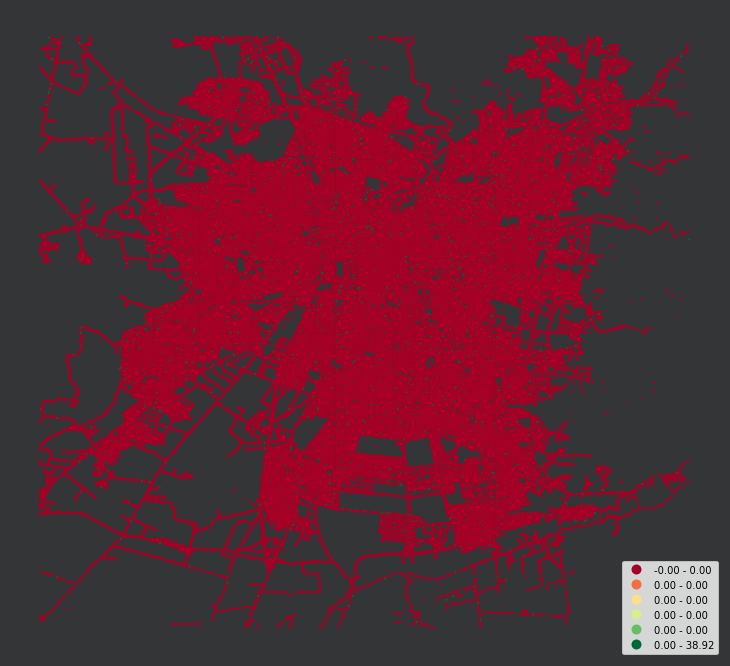

In [180]:
fig, ax = plt.subplots(1,1,figsize = (20,12))
pics.plot(ax=ax,
          column='P_PT',
           marker='.',
           markersize=5,
           cmap='RdYlGn',
           scheme='boxplot',
           legend=True)

ax.axis('off')
fig.set_facecolor("#343536")

Text(0.5, 0, 'Porcentaje')

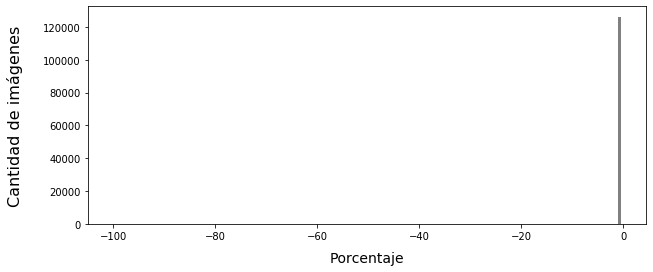

In [181]:
data = pics.loc[:,'P_car'].values 

bins = np.arange(-100,0,0.5)

fig, ax = plt.subplots(figsize=[10,4])
_, bins, patches = plt.hist(np.clip(data, bins[0], bins[-1]), bins=bins, color=['grey'])
#                             normed=1)  # normed is deprecated; replace with density
#                             density=True,
#                             color=['Lightgrey'],
#                             rwidth = 0.9)




# xlabels = [str(round(i,2)) for i in (bins[0:]).tolist()]
# # xlabels[-1] += '+'

N_labels = len(xlabels)
# plt.xlim([0, 80])
# plt.xticks(np.arange(N_labels)*0.5)
# ax.set_xticklabels(xlabels)
# for tick in ax.xaxis.get_major_ticks():
#     tick.label.set_fontsize(14) 
# for tick in ax.yaxis.get_major_ticks():
#     tick.label.set_fontsize(14) 

# # plt.yticks([])
# plt.title('')

plt.ylabel("Cantidad de imágenes", fontsize=16, labelpad=20)
plt.xlabel("Porcentaje", fontsize=14, labelpad=10)


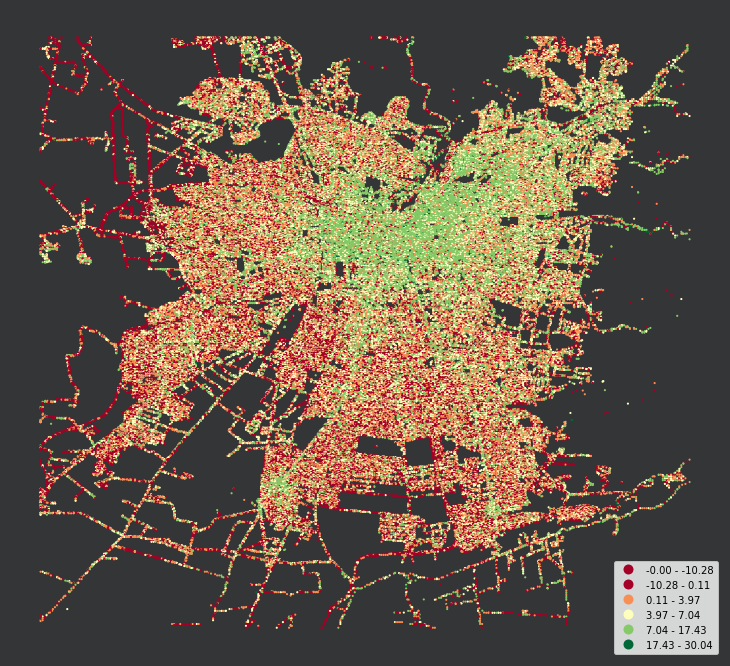

In [182]:
fig, ax = plt.subplots(1,1,figsize = (20,12))
pics.plot(ax=ax,
          column='P_car',
           marker='.',
           markersize=5,
           cmap='RdYlGn',
           scheme='boxplot',
           legend=True)

ax.axis('off')
fig.set_facecolor("#343536")

In [26]:
cmap = plt.cm.OrRd

In [42]:
cmap_reversed = plt.cm.get_cmap('RdYlGn')

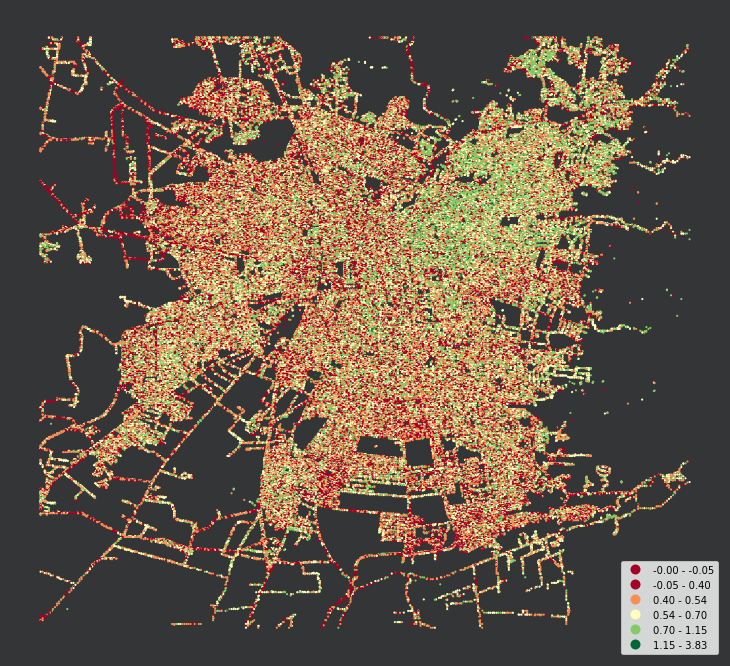

In [43]:
fig, ax = plt.subplots(1,1,figsize = (20,12))
pics.plot(ax=ax, 
          column='D_car',
          marker='.',
          markersize=5,
          cmap=cmap_reversed,
          scheme='boxplot',
          legend=True)

ax.axis('off')
fig.set_facecolor("#343536")

Text(0.5, 0, 'Porcentaje')

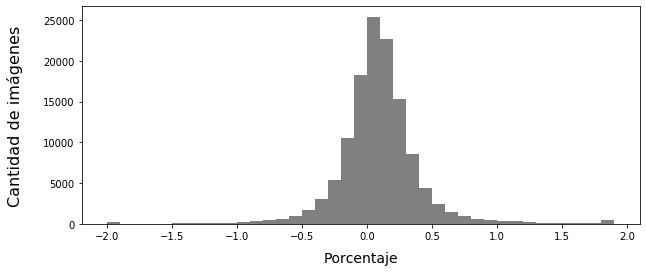

In [67]:
data = pics.loc[:,'P_female'].values 

bins = np.arange(-2,2,0.1)

fig, ax = plt.subplots(figsize=[10,4])
_, bins, patches = plt.hist(np.clip(data, bins[0], bins[-1]), bins=bins, color=['grey'])
#                             normed=1)  # normed is deprecated; replace with density
#                             density=True,
#                             color=['Lightgrey'],
#                             rwidth = 0.9)




# xlabels = [str(round(i,2)) for i in (bins[0:]).tolist()]
# # xlabels[-1] += '+'

N_labels = len(xlabels)
# plt.xlim([0, 80])
# plt.xticks(np.arange(N_labels)*0.5)
# ax.set_xticklabels(xlabels)
# for tick in ax.xaxis.get_major_ticks():
#     tick.label.set_fontsize(14) 
# for tick in ax.yaxis.get_major_ticks():
#     tick.label.set_fontsize(14) 

# # plt.yticks([])
# plt.title('')

plt.ylabel("Cantidad de imágenes", fontsize=16, labelpad=20)
plt.xlabel("Porcentaje", fontsize=14, labelpad=10)


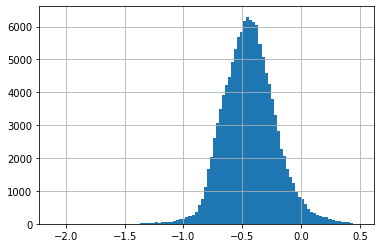

In [32]:
pics['D_bike'].hist(bins=100)

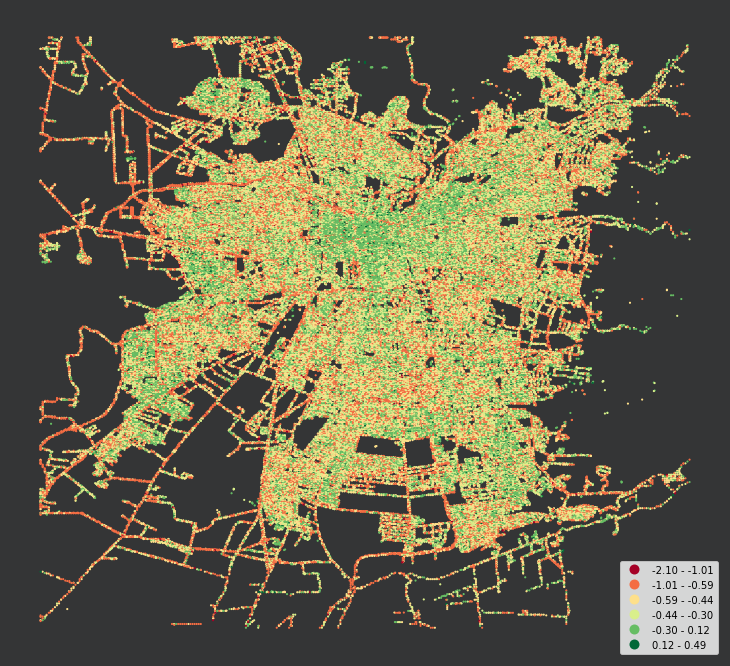

In [44]:
fig, ax = plt.subplots(1,1,figsize = (20,12))
pics.plot(ax=ax,
          column='D_bike',
           marker='.',
           markersize=5,
           cmap='RdYlGn',
           scheme='boxplot',
           legend=True)

ax.axis('off')
fig.set_facecolor("#343536")

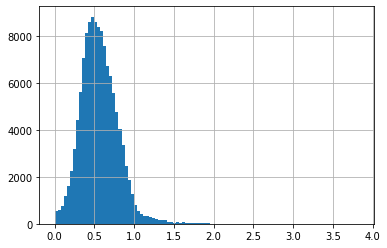

In [39]:
pics['D_car'].hist(bins=100)

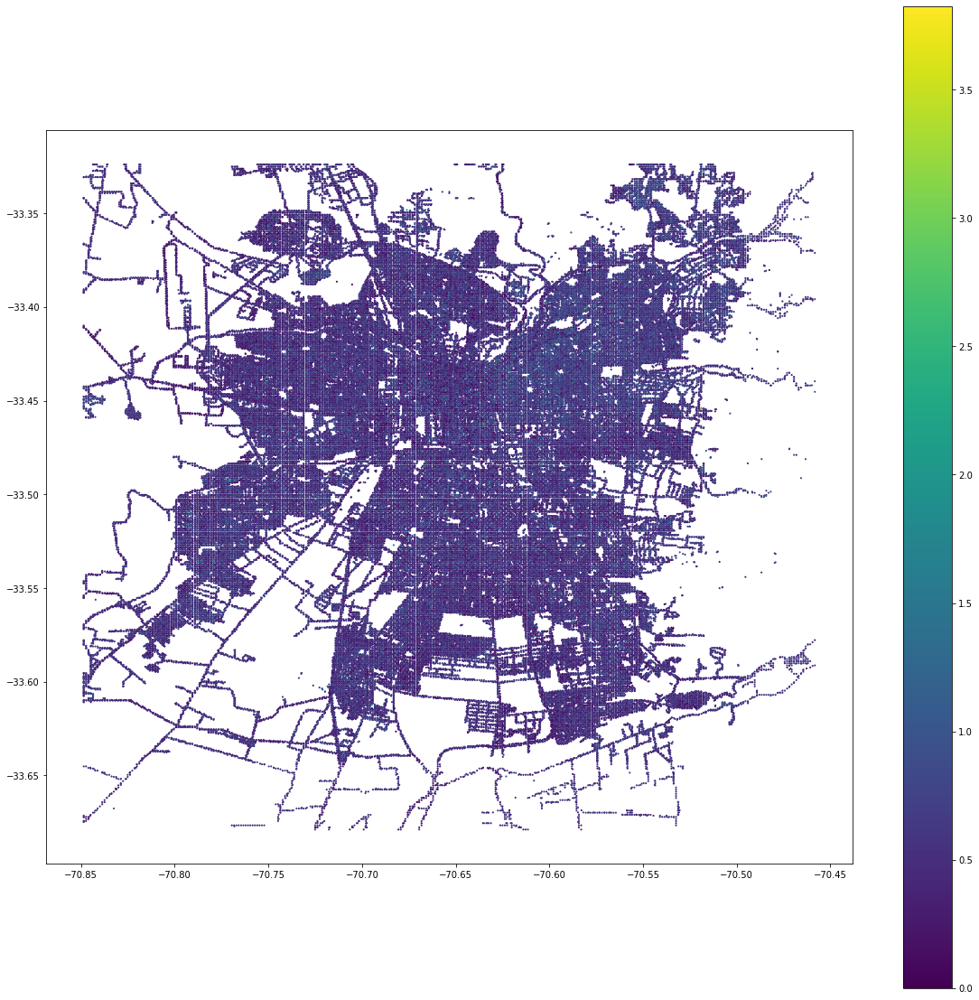

In [40]:
pics.plot(figsize=(20,20),
          column='D_car',
          marker='.',
          markersize=5,
          legend=True)

## INGRESO MEDIO POR ZONA EOD 2012

In [51]:
os.chdir('C:\\Users\\Tom\\Google Drive\\02 Magister\\00 Insumos\\02 Stgo\\Shapes')
# os.listdir()

In [52]:
grid = gpd.read_file('manzanas_01.shp')
# grid = gpd.read_file('Zonas_EOD_GranSantiago.shp')


In [53]:
grid.head()
# grid.shape
# grid.plot()

,COMUNA,MANZ_SII,codigojoin,id_final,funcional_,id_poligon,metro,polygon_id,PTAL,Quintil,geometry
0,13159,968,13159968.0,746.0,1.0,1,0,1,93.351032,5.0,"POLYGON Z ((347141.496 6300695.453 0.000, 3471..."
1,13101,28,1310128.0,2.0,1.0,2,0,2,171.771615,5.0,"POLYGON Z ((346842.597 6298463.070 0.000, 3468..."
2,13101,29,1310129.0,2.0,1.0,3,0,3,165.984232,5.0,"POLYGON Z ((346582.061 6298319.181 0.000, 3465..."
3,13101,30,1310130.0,2.0,1.0,4,0,4,144.683735,5.0,"POLYGON Z ((346528.771 6298307.245 0.000, 3464..."
4,13101,31,1310131.0,2.0,1.0,5,0,5,144.506892,5.0,"POLYGON Z ((346518.022 6298382.764 0.000, 3464..."


In [54]:
os.chdir('C:\\Users\\Tom\\Google Drive\\02 Magister\\00 Insumos\\02 Stgo')
# os.listdir() 
ingreso = pd.read_csv('Ingreso-medio-zona-eod.csv')

In [55]:
# os.chdir('eod2012_utm19s')
# Zonas_EOD_GranSantiago
# os.listdir() 

#eod2012_utm19s.shp

In [56]:
# eod = gpd.read_file('eod2012_utm19s.shp')
os.chdir('C:\\Users\\Tom\\Google Drive\\02 Magister\\00 Insumos\\02 Stgo\\Shapes')
# eod = gpd.read_file('Zonas_EOD_GranSantiago.shp')
eod = gpd.read_file('Zonas_EOD_Santiago_Urbano.shp')
base = gpd.read_file('Zonas_EOD_Santiago_Urbano.shp')

eod = eod.astype({'ID':int})
eod = eod.merge(ingreso, left_on='ID', right_on='Zona')

## Counting point per EOD zone

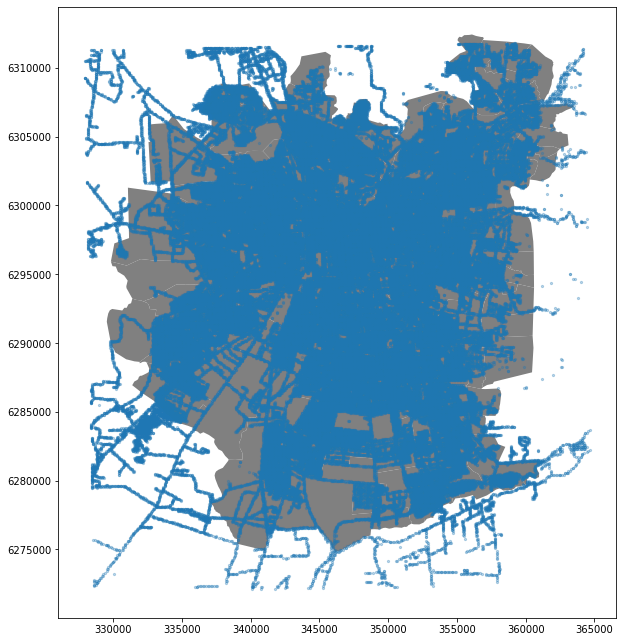

In [60]:
fig, ax = plt.subplots(1,1,figsize = (10,15))

# cmap = plt.get_cmap('Greens', 10)

base.plot(ax=ax, color='grey')
safety.plot(ax=ax, alpha=0.3,markersize=5)

In [62]:
aux_join = gpd.sjoin(base,safety)
# aux_join

C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\geopandas\tools\sjoin.py:61: UserWarning: CRS of frames being joined does not match!({'init': 'epsg:32719'} != {'init': 'epsg:4326'})
  "(%s != %s)" % (left_df.crs, right_df.crs)


In [72]:
safety.shape

(126286, 14)

In [69]:
s_count = aux_join.groupby('Zona').count().ID_right
print('''
N: {}
Mean: {}
Std: {}'''.format(s_count.count(),s_count.mean(),s_count.std()))


N: 737
Mean: 157.62550881953868
Std: 109.51091021953782


C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: `Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.
  """Entry point for launching an IPython kernel.


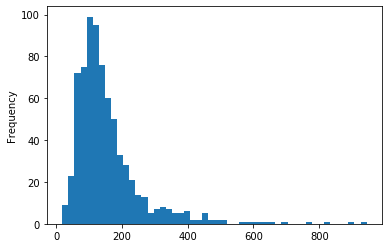

In [75]:
s_count.plot('hist', bins=50)

In [97]:
eod

,ID,AREA,Zona_x,Com,Comuna,PERIMETER,geometry,Zona_y,INGpercap
0,103,4.575649e+05,103.0,13105,El Bosque,2913.355700,"POLYGON ((346376.693 6286027.029, 346366.556 6...",103,3.590254e+05
1,104,7.725462e+05,104.0,13105,El Bosque,4348.343844,"POLYGON ((344151.235 6285465.040, 344263.705 6...",104,9.828447e+05
2,106,2.695745e+06,106.0,13105,El Bosque,7028.533910,"POLYGON ((344415.434 6285878.048, 344263.705 6...",106,1.428665e+05
3,115,7.534193e+05,115.0,13105,El Bosque,3700.486222,"POLYGON ((344415.434 6285878.048, 344412.704 6...",115,7.485295e+05
4,116,7.184305e+05,116.0,13105,El Bosque,3537.818994,"POLYGON ((345133.421 6286261.983, 345243.965 6...",116,4.961252e+05
...,...,...,...,...,...,...,...,...,...
698,332,5.356726e+06,332.0,13115,Lo Barnechea,15065.412974,"POLYGON ((358403.483 6309579.979, 358373.729 6...",332,4.048567e+06
699,329,6.427599e+06,329.0,13115,Lo Barnechea,11964.488366,"POLYGON ((360464.898 6311698.517, 361430.562 6...",329,1.920036e+06
700,330,2.046654e+06,330.0,13115,Lo Barnechea,6230.685409,"POLYGON ((359617.323 6307438.528, 359652.770 6...",330,6.614003e+05
701,301,2.143102e+06,301.0,13114,Las Condes,8533.113517,"POLYGON ((359697.553 6305330.494, 359703.924 6...",301,1.357343e+06


In [79]:
comunas = eod.groupby('Com').mean().loc[:,['INGpercap']]
eod = eod.merge(comunas, left_on='Com',right_index=True, how='left')

In [80]:
eod

,ID,AREA,Zona_x,Com,Comuna,PERIMETER,geometry,Zona_y,INGpercap_x,INGpercap_y
0,103,4.575649e+05,103.0,13105,El Bosque,2913.355700,"POLYGON ((346376.693 6286027.029, 346366.556 6...",103,3.590254e+05,5.064010e+05
1,104,7.725462e+05,104.0,13105,El Bosque,4348.343844,"POLYGON ((344151.235 6285465.040, 344263.705 6...",104,9.828447e+05,5.064010e+05
2,106,2.695745e+06,106.0,13105,El Bosque,7028.533910,"POLYGON ((344415.434 6285878.048, 344263.705 6...",106,1.428665e+05,5.064010e+05
3,115,7.534193e+05,115.0,13105,El Bosque,3700.486222,"POLYGON ((344415.434 6285878.048, 344412.704 6...",115,7.485295e+05,5.064010e+05
4,116,7.184305e+05,116.0,13105,El Bosque,3537.818994,"POLYGON ((345133.421 6286261.983, 345243.965 6...",116,4.961252e+05,5.064010e+05
...,...,...,...,...,...,...,...,...,...,...
698,332,5.356726e+06,332.0,13115,Lo Barnechea,15065.412974,"POLYGON ((358403.483 6309579.979, 358373.729 6...",332,4.048567e+06,2.712757e+06
699,329,6.427599e+06,329.0,13115,Lo Barnechea,11964.488366,"POLYGON ((360464.898 6311698.517, 361430.562 6...",329,1.920036e+06,2.712757e+06
700,330,2.046654e+06,330.0,13115,Lo Barnechea,6230.685409,"POLYGON ((359617.323 6307438.528, 359652.770 6...",330,6.614003e+05,2.712757e+06
701,301,2.143102e+06,301.0,13114,Las Condes,8533.113517,"POLYGON ((359697.553 6305330.494, 359703.924 6...",301,1.357343e+06,1.503291e+06


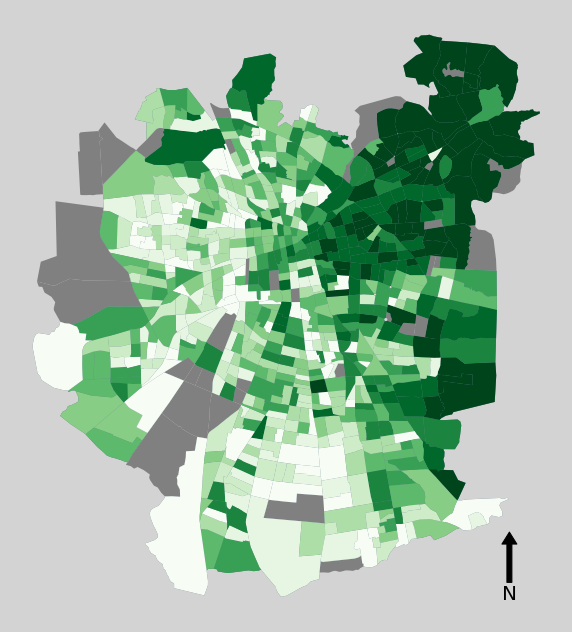

In [81]:
fig, ax = plt.subplots(1,1,figsize = (10,15))

cmap = plt.get_cmap('Greens', 10)

base.plot(ax=ax, color='grey')
eod.plot(ax=ax, alpha=0.3)
eod.plot(ax=ax,
                   column='INGpercap_x',
                   cmap=cmap,
                   scheme='QUANTILES', k=10,
                legend=False)
# intersect.plot(ax=ax, alpha=0.3, color='blue')
# grid.plot(ax=ax, alpha=0.3)

ax.axis('off')
# plt.legend('off')
fig.set_facecolor("lightgray")
# fig.colorbar(ax)
x, y, arrow_length = 0.9, 0.15, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)

plt.show()


In [87]:
# intersect = gpd.sjoin(eod,grid)
intersect = intersect.groupby(['ID']).first()

In [91]:
intersect.head()
# plot()

,AREA,Zona,Com,Comuna,PERIMETER,geometry,index_right,COMUNA,MANZ_SII,codigojoin,id_final,funcional_,id_poligon,metro,polygon_id,PTAL,Quintil
ID,,,,,,,,,,,,,,,,,
1,332293.835407,1.0,13101,Santiago,2387.304832,"POLYGON ((344824.122 6299558.953, 344727.594 6...",716,13134,72,1313472.0,26.0,1.0,739,0,739,40.704403,4.0
2,321064.093854,2.0,13101,Santiago,2269.318125,"POLYGON ((344302.217 6299409.031, 344342.395 6...",1302,13134,238,13134238.0,23.0,1.0,1333,0,1333,130.939804,5.0
3,330688.496738,3.0,13101,Santiago,2301.318272,"POLYGON ((344841.801 6299373.010, 344854.316 6...",656,13134,0,131340.0,23.0,1.0,672,0,672,0.000000,5.0
4,317432.826890,4.0,13101,Santiago,2256.239626,"POLYGON ((343895.731 6298228.986, 343882.337 6...",1332,13134,304,13134304.0,23.0,1.0,1366,0,1366,72.575611,5.0
5,310194.440947,5.0,13101,Santiago,2238.872264,"POLYGON ((344486.782 6298319.043, 344403.601 6...",1328,13134,299,13134299.0,23.0,1.0,1362,0,1362,47.629232,5.0


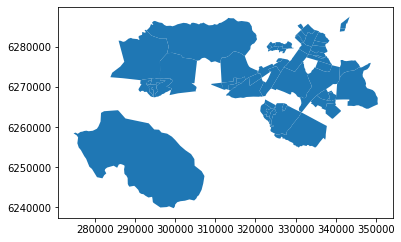

In [59]:
eod.loc[(eod.ID > 777),:].plot()

In [42]:
grid = gpd.sjoin(grid,eod,how='left')

C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\geopandas\tools\sjoin.py:61: UserWarning: CRS of frames being joined does not match!({'init': 'epsg:32719'} != None)
  "(%s != %s)" % (left_df.crs, right_df.crs)


In [44]:
# aux_mean = grid.loc[:,['id_poligon','INGpercap_x']].groupby('id_poligon').mean()
# grid = grid.drop_duplicates('id_poligon')
# grid.loc[:,'INGpercap_x'] = aux_mean

In [134]:
import geoplot

In [47]:
grid.head()

,ID_left,AREA_left,Zona,Com_left,Comuna_left,PERIMETER_left,geometry,index_right,ID_right,AREA_right,Zona_x,Com_right,Comuna_right,PERIMETER_right,Zona_y,INGpercap_x,INGpercap_y
0,103,457564.89486,103.0,13105,El Bosque,2913.3557,"POLYGON ((346376.693 6286027.029, 346366.556 6...",0.0,103.0,4.575649e+05,103.0,13105,El Bosque,2913.355700,103.0,359025.4114,506400.964571
0,103,457564.89486,103.0,13105,El Bosque,2913.3557,"POLYGON ((346376.693 6286027.029, 346366.556 6...",4.0,116.0,7.184305e+05,116.0,13105,El Bosque,3537.818994,116.0,496125.1999,506400.964571
0,103,457564.89486,103.0,13105,El Bosque,2913.3557,"POLYGON ((346376.693 6286027.029, 346366.556 6...",18.0,664.0,6.721971e+05,664.0,13131,San Ramón,3384.310305,664.0,457088.3311,531562.385562
0,103,457564.89486,103.0,13105,El Bosque,2913.3557,"POLYGON ((346376.693 6286027.029, 346366.556 6...",81.0,252.0,3.408603e+06,252.0,13112,La Pintana,7912.733037,252.0,279179.6719,394557.222914
0,103,457564.89486,103.0,13105,El Bosque,2913.3557,"POLYGON ((346376.693 6286027.029, 346366.556 6...",84.0,261.0,7.825133e+05,261.0,13112,La Pintana,3764.112389,261.0,509808.5503,394557.222914


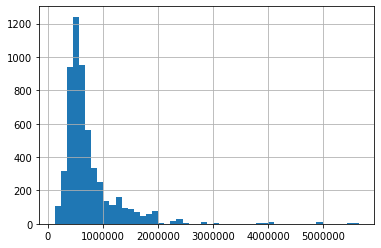

In [45]:
grid['INGpercap_x'].hist(bins=50)

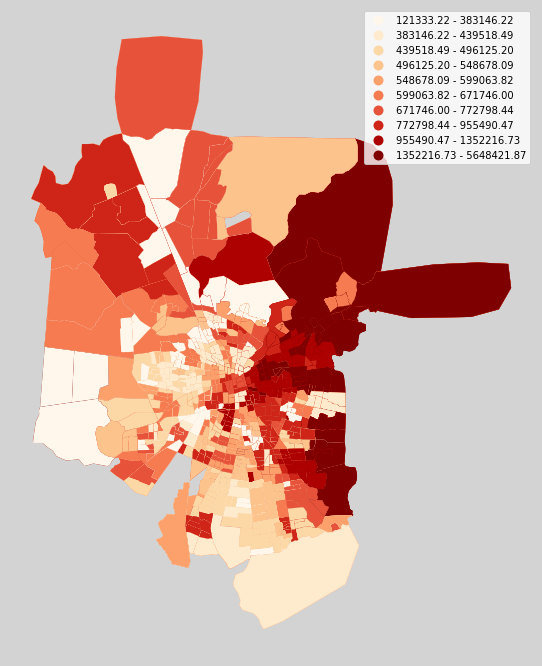

In [58]:

# grid.loc[:,'INGpercap_x'] = np.clip(grid.loc[:,'INGpercap_x'],breaks[0],breaks[-1])

fig, ax = plt.subplots(1,1,figsize = (20,12))

cmap = plt.get_cmap('OrRd', 10)

ax = grid.loc[(grid.ID_left < 777),:].dropna().plot(ax=ax,
                   column='INGpercap_x',
                   cmap=cmap,
                   scheme='QUANTILES', k=10,
                legend=True)

# grid.dropna().plot(column='INGpercap_x',
#                         cmap='OrRd',
#                         scheme="User_Defined",
#                         legend=True, classification_kwds=dict(bins=[200000,300000,500000,700000]),
#                         ax=ax)


# ax.legend(legend_kwds=dict(labels=['P1','P2','P3','P4','P5','P1','P2','P3','P4','P5']))
# handles, labels = ax.get_legend_handles_labels()
# ax.legend(['P1','P2','P3','P4','P5',
#               'P1','P2','P3','P4','P5'])

ax.axis('off')
fig.set_facecolor("lightgray")
# fig.colorbar(ax)
plt.show()

#  'NaturalBreaks'
# 'boxplot',
#'equalinterval', 
# 'fisherjenks', NO TERMINA DE CORRER NUNCA
# 'fisherjenkssampled',
# 'headtailbreaks',
# 'jenkscaspall',
# 'jenkscaspallforced',
# 'jenkscaspallsampled',
# 'maxp',
# 'maximumbreaks',
# 'naturalbreaks',
# 'quantiles',
# 'percentiles',
# 'stdmean',
# 'userdefined'

In [168]:
grid = grid.drop(columns=['index_right'])
grid = gpd.sjoin(grid,pics,how='left',op='contains')

C:\Users\Tom\Anaconda3\envs\bio\lib\site-packages\geopandas\tools\sjoin.py:61: UserWarning: CRS of frames being joined does not match!({'init': 'epsg:32719'} != {'init': 'epsg:4326'})
  "(%s != %s)" % (left_df.crs, right_df.crs)


In [173]:
?gpd.sjoin

In [165]:
grid.columns

Index(['COMUNA', 'MANZ_SII', 'codigojoin', 'id_final', 'funcional_',
       'id_poligon', 'metro', 'polygon_id', 'PTAL', 'Quintil', 'geometry',
       'ID_left', 'AREAold', 'Zona_x', 'Com', 'Comuna', 'area_new', 'leng_new',
       'areakm2', 'Zona_y', 'INGpercap_x', 'INGpercap_y', 'Unnamed: 0_left',
       'ID_right', 'Utilidad_left', 'D_female_left', 'D_pedestrian_left',
       'D_bike_left', 'D_PT_left', 'D_car_left', '0_left', '1_left',
       'lat_left', 'long_left', 'P_female_left', 'P_bike_left',
       'P_pedestrian_left', 'P_PT_left', 'P_car_left', 'index_right',
       'Unnamed: 0_right', 'ID', 'Utilidad_right', 'D_female_right',
       'D_pedestrian_right', 'D_bike_right', 'D_PT_right', 'D_car_right',
       '0_right', '1_right', 'lat_right', 'long_right', 'P_female_right',
       'P_bike_right', 'P_pedestrian_right', 'P_PT_right', 'P_car_right'],
      dtype='object')

In [170]:
aux_mean = grid.loc[:,['id_poligon',
                       'Utilidad',
                       'D_female',
                       'D_pedestrian',
                       'D_bike',
                       'D_PT',
                       'D_car',
                       'P_female',
                       'P_bike',
                       'P_pedestrian',
                       'P_PT',
                       'P_car']].groupby('id_poligon').mean()
grid = grid.drop_duplicates('id_poligon')
grid.loc[:,['Utilidad',
         'D_female',             
         'D_pedestrian',           
         'D_bike',
         'D_PT',   
         'D_car',     
         'P_female',    
         'P_bike', 
         'P_pedestrian',   
         'P_PT',     
         'P_car']] = aux_mean

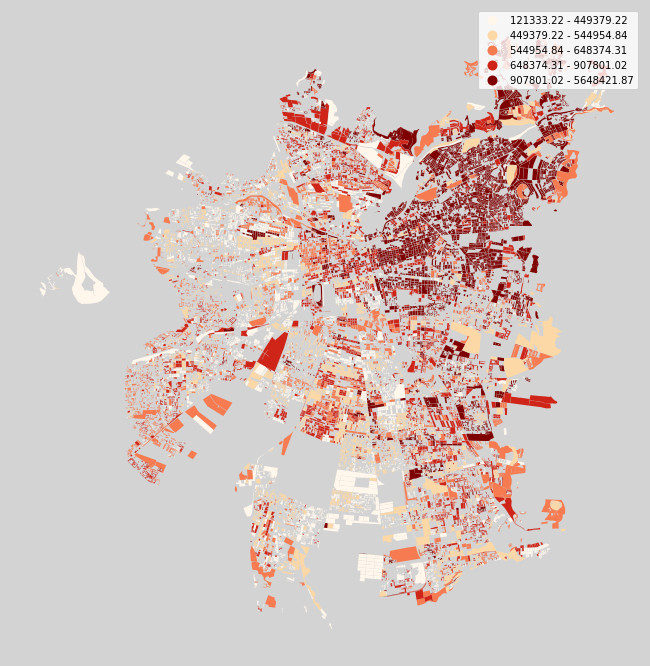

In [171]:
fig, ax = plt.subplots(1,1,figsize = (20,12))
ax = grid.dropna().plot(ax=ax,
                   column='INGpercap_x',
                   cmap=cmap,
                   scheme='QUANTILES', k=5,
                legend=True)



ax.axis('off')
fig.set_facecolor("lightgray")
# fig.colorbar(ax)
plt.show()


In [172]:
grid.describe().T

,count,mean,std,min,25%,50%,75%,max
COMUNA,55971.0,1.498128e+04,1.002993e+03,13101.000000,1.411300e+04,1.510800e+04,1.615300e+04,1.640100e+04
MANZ_SII,55971.0,3.443988e+03,3.225852e+03,0.000000,7.545000e+02,2.877000e+03,5.574000e+03,9.930000e+04
codigojoin,55971.0,1.342514e+08,1.983569e+08,131010.000000,1.516040e+07,1.415625e+08,1.610666e+08,1.616496e+09
id_final,55971.0,4.748126e+02,2.352206e+02,1.000000,2.930000e+02,5.160000e+02,6.480000e+02,8.630000e+02
funcional_,55971.0,1.072502e+00,4.348123e-01,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,4.000000e+00
...,...,...,...,...,...,...,...,...
P_female,31994.0,5.820621e+00,3.947635e+00,-33.204821,4.000618e+00,6.214315e+00,8.183991e+00,1.116309e+02
P_bike,31994.0,2.688946e+01,8.715485e+00,-55.104107,2.136070e+01,2.634828e+01,3.186662e+01,1.099248e+02
P_pedestrian,31994.0,1.448332e+01,6.120186e+00,-40.454826,1.041871e+01,1.400121e+01,1.796138e+01,6.900896e+01
P_PT,31994.0,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00


In [159]:
A = pd.DataFrame({'A':[1,2,2,2],'B':[1,2,None,4]})
A.dropna().groupby('A').mean()

,B
A,
1,1.0
2,3.0


In [162]:
aux_mean.count()

Utilidad        31995
D_female        31995
D_pedestrian    31995
D_bike          31995
D_PT            31995
D_car           31995
P_female        31995
P_bike          31995
P_pedestrian    31995
P_PT            31995
P_car           31995
dtype: int64